# Introduction of the business problem



## Problem Statement


A house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you may expect — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighborhood and based on gathered data you will try to assess your house price.



## Need of the Project

Real estate is one of the most popular domain amongst individuals all around the world. Also, real estate is the most popular choice of investement as well because of its nature of investment and return.
But it is the least transparent industry in our ecosystem. Housing prices keep changing day in and day out and sometimes are hyped rather than being based on valuation. Predicting housing prices with real factors will provide an estimate price of the house which will be highly accurate and will help those which are not familiar with this domain. We do so by making our evaluations based on every basic parameter that is considered while determining the price of the house about which an individial might not be aware of. Therefore, we can analyze the available data of the properties in the area and can predict the price.


## Understanding Business/Social Opportunity

House Price prediction, is important to drive Real Estate efficiency. As earlier, House prices were determined by calculating the acquiring and selling price in a locality. Therefore, the House Price prediction model is very essential in filling the information gap and improve Real Estate efficiency.
As people are not aware of the features that helps to determine the property price, we can provide them a service through our house price predicition model. 

# DATA REPORT

## VISUAL INSPECTION OF DATA

In [1]:
# Loading the required Library for data Loading, Processing and EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import dataframe_image as dfi

### Read the Data

In [2]:
house_df = pd.read_excel('innercity.xlsx')

In [3]:
pd.set_option('display.max_columns', 500)

### Checking the first 5 rows of the data (Sample of the data)

In [4]:
sample_house_data = house_df.head()
sample_house_data

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,3,8.0,1800.0,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,4,6.0,670.0,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,3,8.0,3040.0,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,3,8.0,1740.0,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,3,7.0,1120.0,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


In [5]:
dfi.export(sample_house_data, 'sample_house_data.png')

### Checking the shape of the data

In [6]:
house_df.shape

(21613, 23)

### Checking the Columns of the data

In [7]:
house_df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

### Data Dictionary

1. cid: a notation for a house
2. dayhours: Date house was sold
3. price: Price is prediction target
4. room_bed: Number of Bedrooms/House
5. room_bath: Number of bathrooms/bedrooms
6. living_measure: square footage of the home
7. lot_measure: quare footage of the lot
8. ceil: Total floors (levels) in house
9. coast: House which has a view to a waterfront
10. sight: Has been viewed
11. condition: How good the condition is (Overall)
12. quality: grade given to the housing unit, based on grading system
13. ceil_measure: square footage of house apart from basement
14. basement_measure: square footage of the basement
15. yr_built: Built Year
16. yr_renovated: Year when house was renovated
17. zipcode: zip
18. lat: Latitude coordinate
19. long: Longitude coordinate
20. living_measure15: Living room area in 2015(implies-- some renovations) This might or
might not have affected the lotsize area
21. lot_measure15: lotSize area in 2015(implies-- some renovations) 22. furnished: Based on the quality of room
23. total_area: Measure of both living and lot

### Information About the dataset

In [8]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

What we observe from the above table is that certain variables that are showing up as object data type even though the data in them is of numeric types.

In [9]:
lst = ['ceil', 'coast', 'condition', 'yr_built', 'long']
for item in lst:
    print(item)
    print(house_df[item].unique())

ceil
[1 2 3 1.5 2.5 '$' nan 3.5]
coast
[0 1 '$' nan]
condition
[3 4 5 2 nan 1 '$']
yr_built
[1966 1948 2009 1924 1994 2005 1978 1983 2012 1912 1990 1967 1919 1908
 1950 2000 2013 1943 1922 1977 2004 1935 1964 1945 1987 2008 1940 2003
 1988 1985 1998 1995 1946 1984 1958 1963 1942 2014 1971 1936 1954 1923
 2002 1972 2007 1930 1962 1999 1953 1965 2010 1997 2006 1979 1996 1992
 1968 1980 1981 1969 2001 1929 1952 1916 1976 1974 1920 1931 1975 1960
 1900 '$' 1986 1989 1906 1955 1956 1915 1941 1993 2011 1925 1947 1991 1926
 1927 1951 1961 1932 1917 1928 1959 1921 1911 1949 1982 1913 1957 1914
 1938 1973 1937 1944 1970 1901 1907 1939 1918 1934 1904 2015 1909 1910
 1905 1902 1933 1903 nan]
long
[-122.183 -122.274 -122.256 -122.213 -122.285 '$' -122.333 -122.165
 -122.15 -122.178 -121.87 -122.352 -122.122 -122.275 -122.234 -122.324
 -122.321 -122.277 -122.196 -122.398 -122.019 -122.181 -122.325 -122.191
 -122.026 -122.084 -122.3 -122.287 -122.011 -122.127 -122.281 -122.221
 -121.859 -121.913 -12

above mentioned variables should be of type number but instead they are of type object because we can see after listing their unique values, variables have the erroneous value '$'. This is the reason their data type is object type.

In [10]:
# Replacing the '$' with nan
house_df.replace('$',0,inplace=True)
house_df.replace('np.nan',0,inplace=True)

In [11]:
# Rechecking on the above
lst = ['ceil', 'coast', 'condition', 'yr_built', 'long']
for item in lst:
    print(item)
    print(house_df[item].unique())

ceil
[1.  2.  3.  1.5 2.5 0.  nan 3.5]
coast
[ 0.  1. nan]
condition
[ 3.  4.  5.  2. nan  1.  0.]
yr_built
[1966. 1948. 2009. 1924. 1994. 2005. 1978. 1983. 2012. 1912. 1990. 1967.
 1919. 1908. 1950. 2000. 2013. 1943. 1922. 1977. 2004. 1935. 1964. 1945.
 1987. 2008. 1940. 2003. 1988. 1985. 1998. 1995. 1946. 1984. 1958. 1963.
 1942. 2014. 1971. 1936. 1954. 1923. 2002. 1972. 2007. 1930. 1962. 1999.
 1953. 1965. 2010. 1997. 2006. 1979. 1996. 1992. 1968. 1980. 1981. 1969.
 2001. 1929. 1952. 1916. 1976. 1974. 1920. 1931. 1975. 1960. 1900.    0.
 1986. 1989. 1906. 1955. 1956. 1915. 1941. 1993. 2011. 1925. 1947. 1991.
 1926. 1927. 1951. 1961. 1932. 1917. 1928. 1959. 1921. 1911. 1949. 1982.
 1913. 1957. 1914. 1938. 1973. 1937. 1944. 1970. 1901. 1907. 1939. 1918.
 1934. 1904. 2015. 1909. 1910. 1905. 1902. 1933. 1903.   nan]
long
[-122.183 -122.274 -122.256 -122.213 -122.285    0.    -122.333 -122.165
 -122.15  -122.178 -121.87  -122.352 -122.122 -122.275 -122.234 -122.324
 -122.321 -122.277 -12

Since we have replaced the '$' character with nan, we can easily change their data type to the correct data type i.e. number type

In [12]:
for item in lst: 
    house_df[item]= house_df[item].astype('float64')

In [13]:
# rechecking on the above
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  float64
 8   coast             21612 non-null  float64
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  float64
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  float64
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

### Describing the dataset

In [14]:
desc_data = house_df.describe().T
desc_data

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21505.0,3.371355e+00,9.302886e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21505.0,2.115171e+00,7.702481e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21596.0,2.079861e+03,9.184961e+02,2.900000e+02,1.429250e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21571.0,1.510458e+04,4.142362e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068450e+04,1.651359e+06
ceil,21571.0,1.492050e+00,5.424017e-01,0.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21612.0,7.449565e-03,8.599076e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21556.0,2.343663e-01,7.664376e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21556.0,3.404899e+00,6.617790e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


In [15]:
dfi.export(desc_data, 'desc_data.png')

# EXPLORATORY DATA ANALYSIS

### Checking for Missing / Null values

In [16]:
house_df.isnull().sum()

cid                   0
dayhours              0
price                 0
room_bed            108
room_bath           108
living_measure       17
lot_measure          42
ceil                 42
coast                 1
sight                57
condition            57
quality               1
ceil_measure          1
basement              1
yr_built              1
yr_renovated          0
zipcode               0
lat                   0
long                  0
living_measure15    166
lot_measure15        29
furnished            29
total_area           29
dtype: int64

In [17]:
house_df.isnull().sum().sort_values(ascending = False)

living_measure15    166
room_bed            108
room_bath           108
sight                57
condition            57
lot_measure          42
ceil                 42
total_area           29
furnished            29
lot_measure15        29
living_measure       17
basement              1
yr_built              1
quality               1
ceil_measure          1
coast                 1
yr_renovated          0
zipcode               0
lat                   0
long                  0
dayhours              0
price                 0
cid                   0
dtype: int64

In [18]:
missing_val = house_df.isnull().sum().sort_values(ascending = False)

In [19]:
missing_val

living_measure15    166
room_bed            108
room_bath           108
sight                57
condition            57
lot_measure          42
ceil                 42
total_area           29
furnished            29
lot_measure15        29
living_measure       17
basement              1
yr_built              1
quality               1
ceil_measure          1
coast                 1
yr_renovated          0
zipcode               0
lat                   0
long                  0
dayhours              0
price                 0
cid                   0
dtype: int64

In [20]:
missing_val.sum()

689

There are total 689 null values in the dataset across all the columns

In [21]:
print(f'Total Number of rows that we will be droping if we drop null values: {house_df.shape[0]- house_df.dropna().shape[0]}')

Total Number of rows that we will be droping if we drop null values: 226


In [22]:
print(f'Percentage of values that we will drop: {(house_df.shape[0]- house_df.dropna().shape[0])/house_df.shape[0] * 100}')

Percentage of values that we will drop: 1.0456669597001804


In [23]:
for col in ['living_measure', 'living_measure15', 'room_bed', 'room_bath', 'lot_measure', 'ceil',
           'total_area', 'lot_measure15', 'sight', 'quality','ceil_measure', 'yr_built', 'condition']:
    house_df[col] = house_df[col].fillna(house_df[col].median())
    

In [24]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21613 non-null  float64
 4   room_bath         21613 non-null  float64
 5   living_measure    21613 non-null  float64
 6   lot_measure       21613 non-null  float64
 7   ceil              21613 non-null  float64
 8   coast             21612 non-null  float64
 9   sight             21613 non-null  float64
 10  condition         21613 non-null  float64
 11  quality           21613 non-null  float64
 12  ceil_measure      21613 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21613 non-null  float64
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

In [25]:
for col in ['furnished', 'basement', 'coast']:
    house_df[col] = house_df[col].fillna(house_df[col].mode())

In [26]:
house_df['coast'] = house_df['coast'].fillna(house_df['coast'].median())

In [27]:
house_df.isnull().sum()

cid                  0
dayhours             0
price                0
room_bed             0
room_bath            0
living_measure       0
lot_measure          0
ceil                 0
coast                0
sight                0
condition            0
quality              0
ceil_measure         0
basement             1
yr_built             0
yr_renovated         0
zipcode              0
lat                  0
long                 0
living_measure15     0
lot_measure15        0
furnished           29
total_area           0
dtype: int64

### Checking Duplicate items

In [28]:
house_df.duplicated().sum()

0

### Feature Engineering 
-  In column 'dayhours' we have year month and date. T0000 is dummy and we can remove it.
- For 'basement' column we can replace the given values with 0 and 1 as it will generate more insights while doing EDA.
- For yr_renovated we can again replace this with 0 and 1 as it will generate more insights while doing EDA.
- Extracting the year in which the house was sold i.e. the sale year.
- Calculating the age of the house depending on the fact if the house was renovated or not renovated. If the house was renovated, then the age of the house will be calculated from the renovation year. If the house was not renovated, then the age of the house will be calculated from the build year.

In [29]:
df = house_df.copy()

In [30]:
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0


In [31]:
df['dayhours'] = [x.strip().replace('T000000', '') for x in df['dayhours']]

In [32]:
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0
1,3145600250,20150317,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0
2,7129303070,20140820,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0
3,7338220280,20141010,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0
4,7950300670,20150218,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0


In [33]:
df['basement'] = df['basement'].apply(lambda x: 0 if x == 0 else 1)

In [34]:
df['yr_renovated'] = df['yr_renovated'].apply(lambda x: 0 if x == 0 else 1)

In [35]:
df['sale_year'] = df['dayhours'].str[0:4]

In [36]:
df['sale_year'] = df['sale_year'].astype('int64')

In [37]:
df['furnished'] = df['furnished'].apply(lambda x: 0 if x == 0 else 1)

## Univariate Analysis

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21613 non-null  float64
 4   room_bath         21613 non-null  float64
 5   living_measure    21613 non-null  float64
 6   lot_measure       21613 non-null  float64
 7   ceil              21613 non-null  float64
 8   coast             21613 non-null  float64
 9   sight             21613 non-null  float64
 10  condition         21613 non-null  float64
 11  quality           21613 non-null  float64
 12  ceil_measure      21613 non-null  float64
 13  basement          21613 non-null  int64  
 14  yr_built          21613 non-null  float64
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

In [39]:
plt.figure(figsize = (40, 80), dpi = 200)
columns = ['price', 'room_bed', 'room_bath', 'lot_measure', 'living_measure', 'ceil', 'condition',
          'quality', 'ceil_measure', 'yr_built', 'living_measure15',
          'lot_measure15', 'total_area']
for i in range(len(columns)):
    plt.subplot(10, 2, i+1)
    sns.boxplot(data = df, x = df[columns[i]])
    plt.title(f'Boxplot - {columns[i]}', fontdict = {'fontsize': 30})
    plt.xlabel(columns[i],fontsize = 30)
    plt.tight_layout()
    plt.savefig('Uni_Boxplot.png', bbox_inches = 'tight')

In [40]:
plt.figure(figsize = (40, 80), dpi = 200)
columns =  ['price', 'room_bed', 'room_bath', 'lot_measure', 'living_measure', 'ceil', 'condition',
          'quality', 'ceil_measure', 'yr_built', 'living_measure15',
          'lot_measure15', 'total_area']
for i in range(len(columns)):
    plt.subplot(10, 2, i+1)
    sns.distplot(x = df[columns[i]])
    plt.title(f'Distribution plot - {columns[i]}', fontdict = {'fontsize': 30})
    plt.xlabel(columns[i],fontsize = 30)
    plt.tight_layout()
    plt.savefig('Uni_dist.png', bbox_inches = 'tight')

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility)

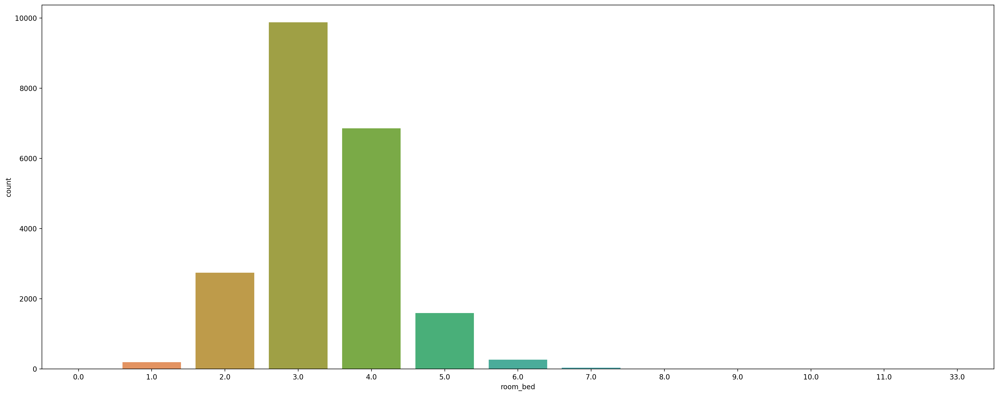

In [41]:
plt.figure(figsize = (20, 8), dpi = 200)
sns.countplot(data = df, x = 'room_bed')
plt.tight_layout()
plt.savefig('countplot_room_bed.png')

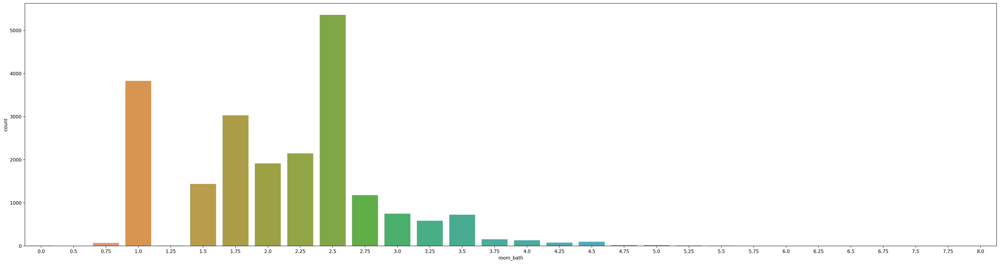

In [42]:
plt.figure(figsize = (30, 8), dpi = 200)
sns.countplot(data = df, x = 'room_bath')
plt.tight_layout()
plt.savefig('countplot_room_bath.png')

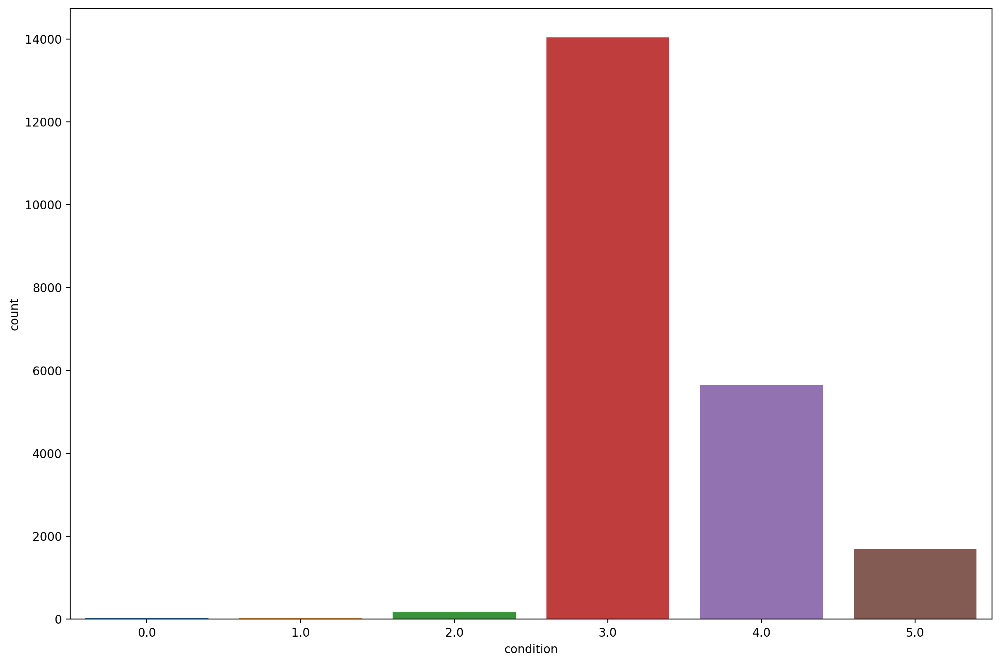

In [43]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.countplot(data = df, x = 'condition')
plt.tight_layout()
plt.savefig('countplot_condition.png')

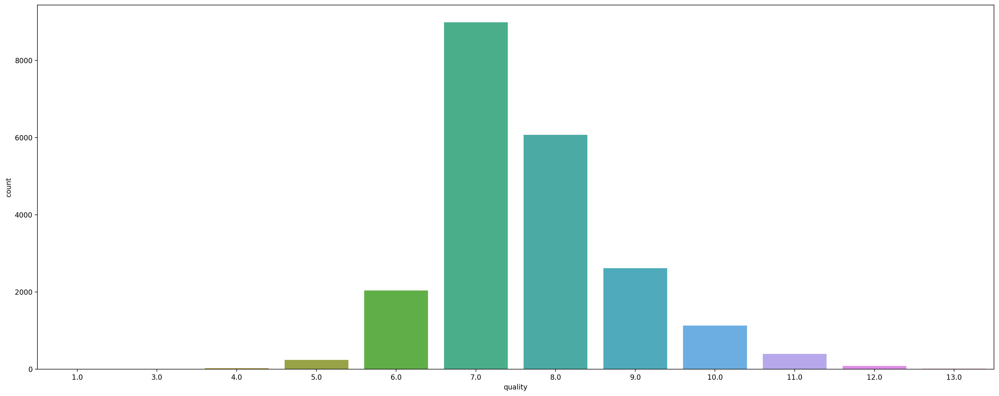

In [44]:
plt.figure(figsize = (20, 8), dpi = 200)
sns.countplot(data = df, x = 'quality')
plt.tight_layout()
plt.savefig('countplot_quality.png')

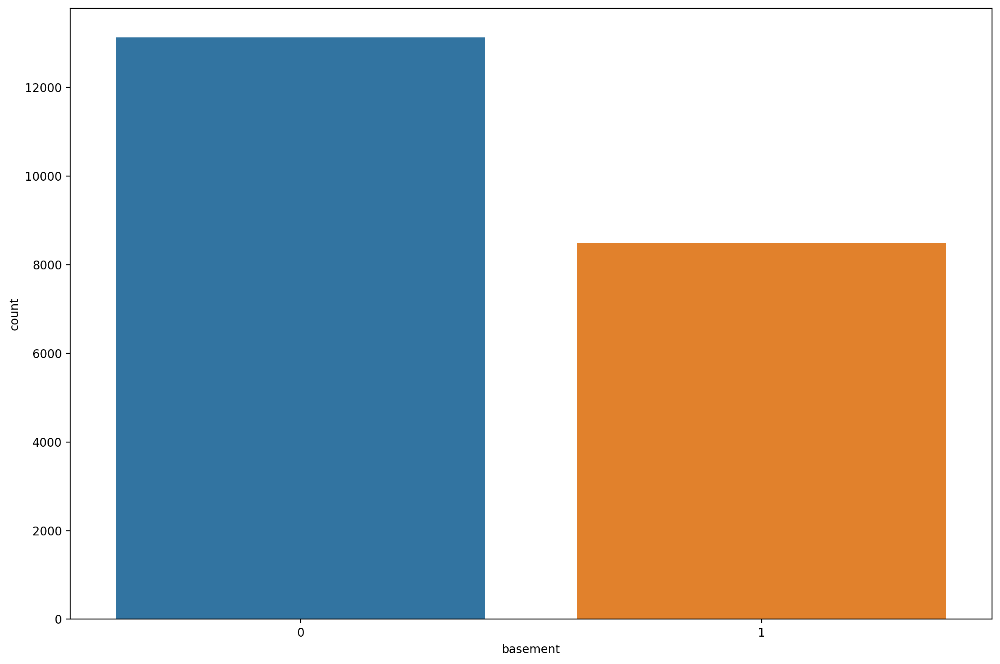

In [45]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.countplot(data = df, x = 'basement')
plt.tight_layout()
plt.savefig('countplot_basement.png')

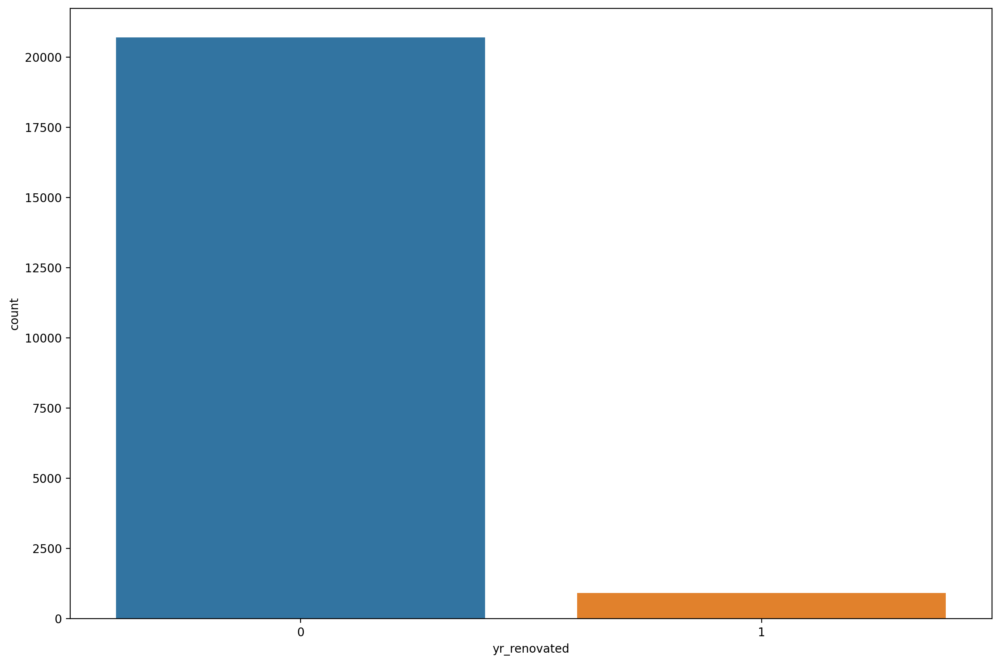

In [46]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.countplot(data = df, x = 'yr_renovated')
plt.tight_layout()
plt.savefig('countplot_yr_renovated.png')

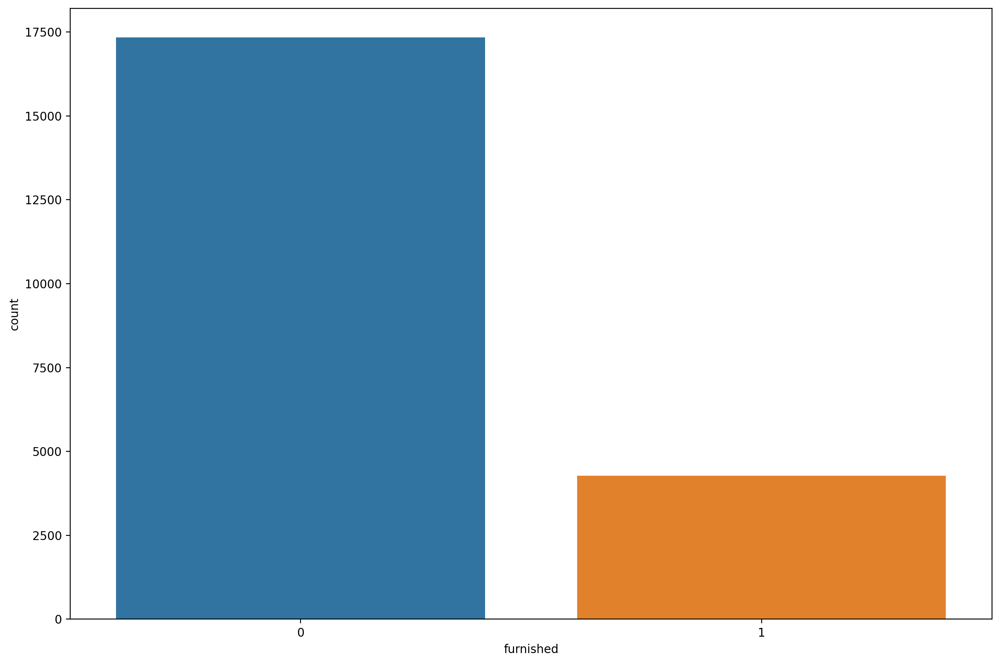

In [47]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.countplot(data = df, x = 'furnished')
plt.tight_layout()
plt.savefig('countplot_furished.png')

## Bivariate Analysis

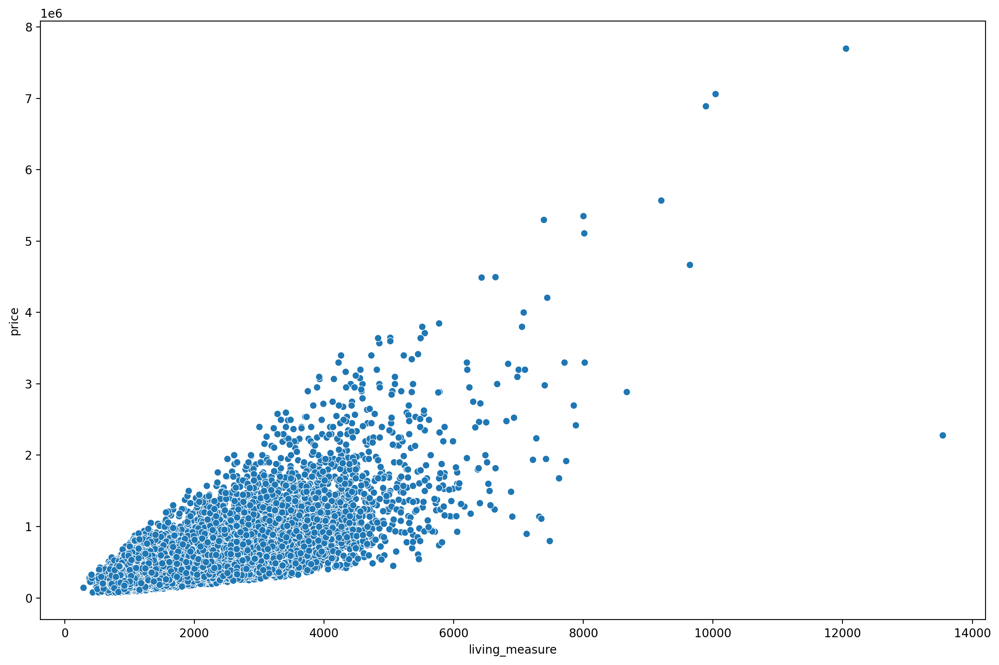

In [48]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'living_measure', y = 'price')
plt.tight_layout()
plt.savefig('scattter_living_measure_vs_price.png')

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3720: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


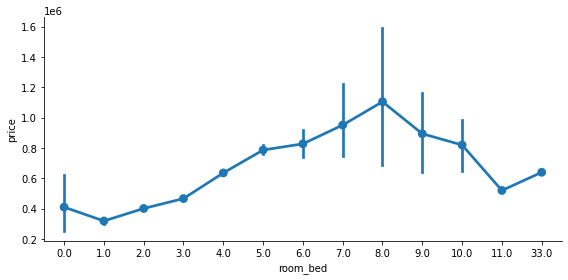

In [49]:
sns.factorplot(x='room_bed',y='price',data=df, size=4, aspect=2)
plt.tight_layout()
plt.savefig('factorplot_roombed_vs_price.png')

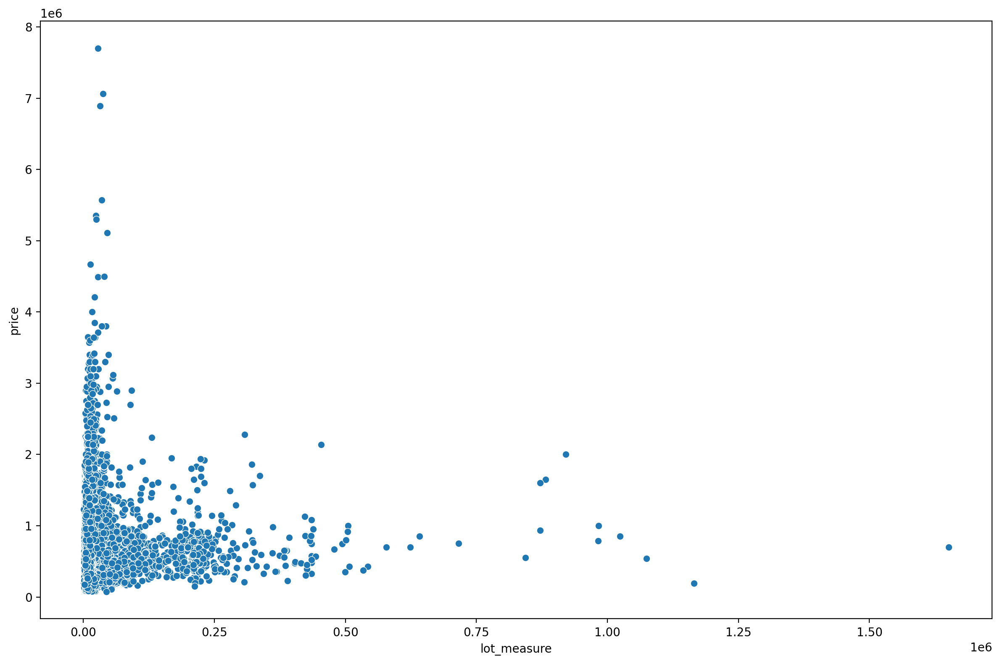

In [50]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'lot_measure', y = 'price')
plt.tight_layout()
plt.savefig('scattter_lot_measure_vs_price.png')

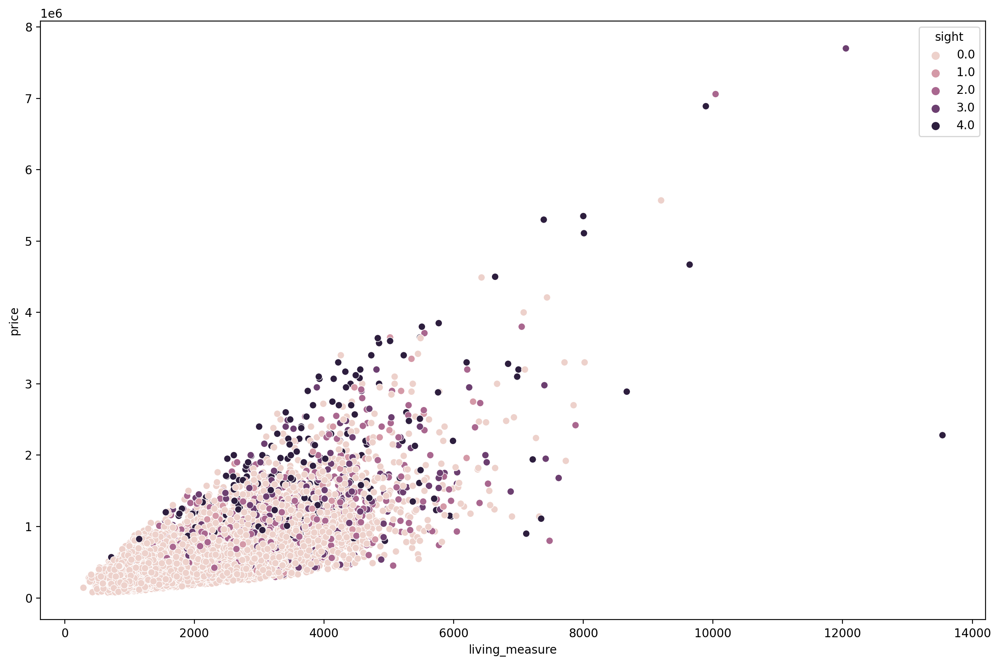

In [51]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'living_measure', y = 'price',hue = 'sight')
plt.tight_layout()
plt.savefig('scattter_living_measure_vs_price_vs_sight.png')

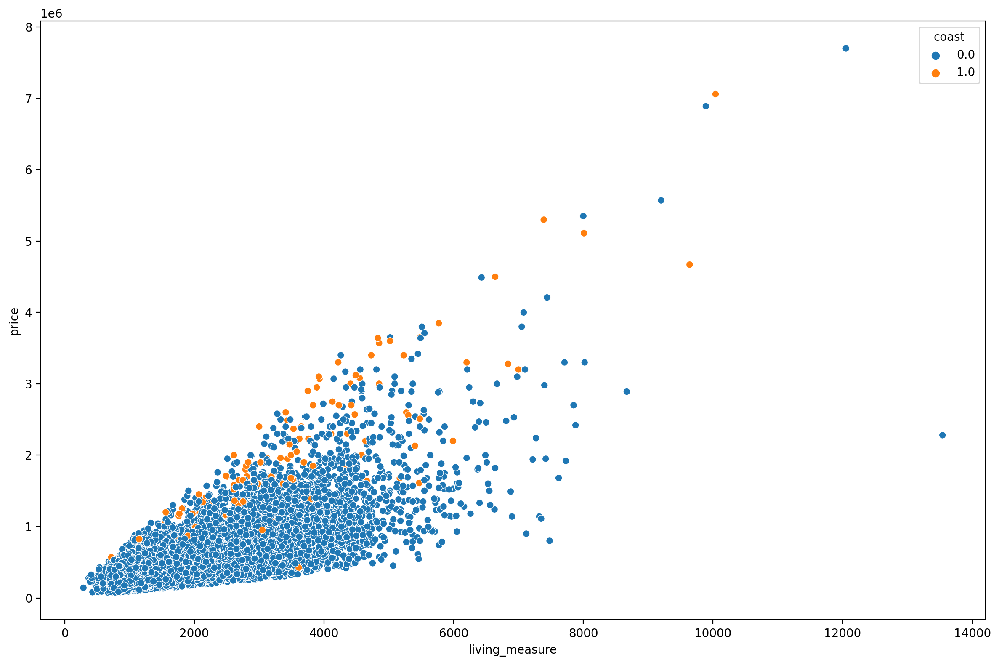

In [52]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'living_measure', y = 'price',hue = 'coast')
plt.tight_layout()
plt.savefig('scattter_livingprice_vs_price_vs_coast.png')

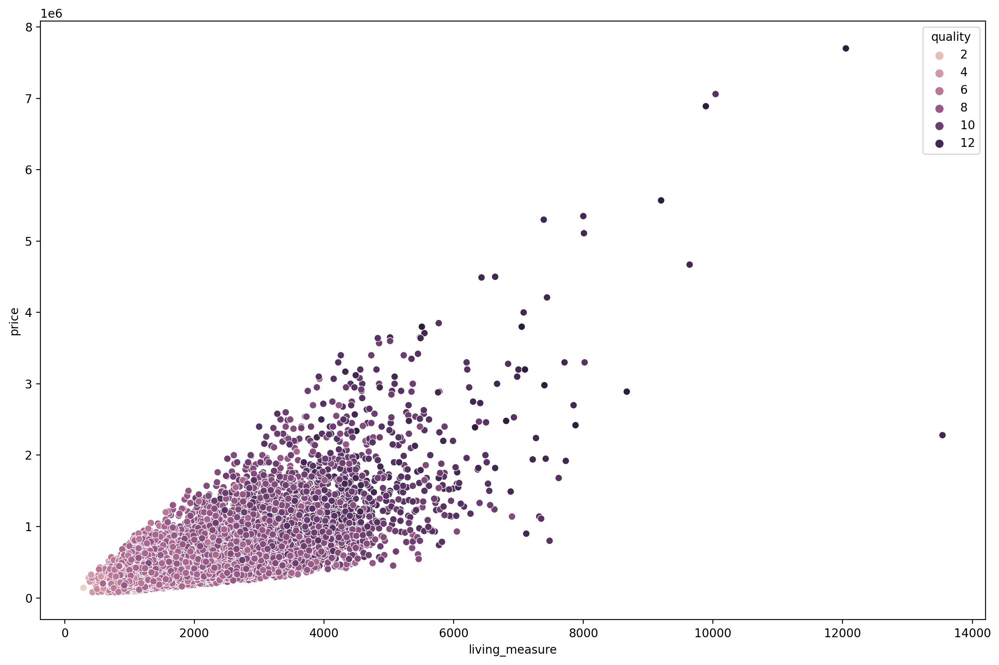

In [53]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'living_measure', y = 'price',hue = 'quality')
plt.tight_layout()
plt.savefig('scattter_livingprice_vs_price_vs_quality.png')

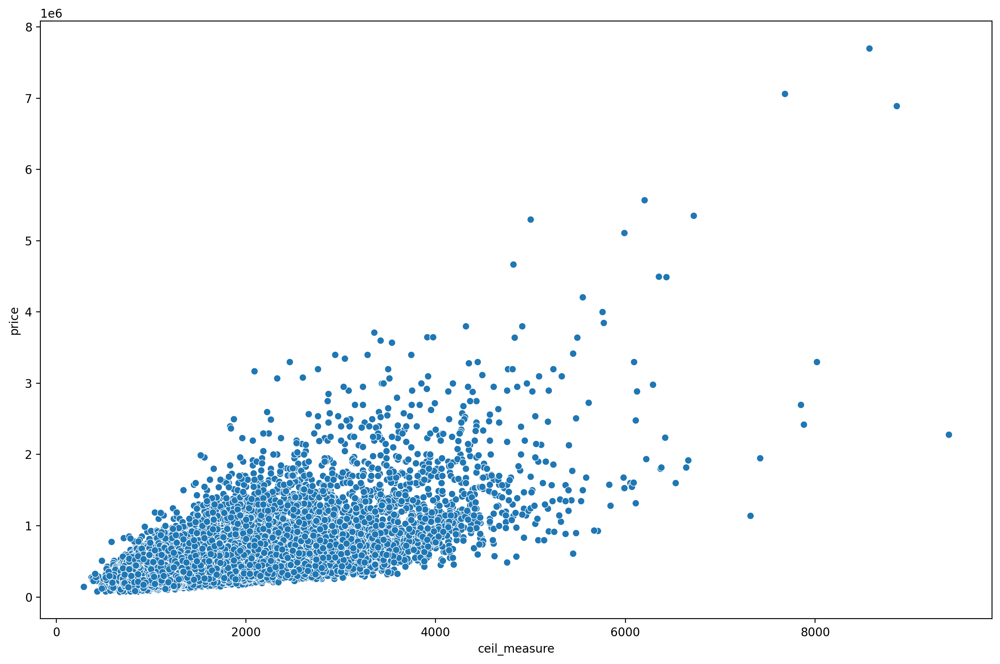

In [54]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'ceil_measure', y = 'price')
plt.tight_layout()
plt.savefig('scattter_ceilmeasure_vs_price.png')

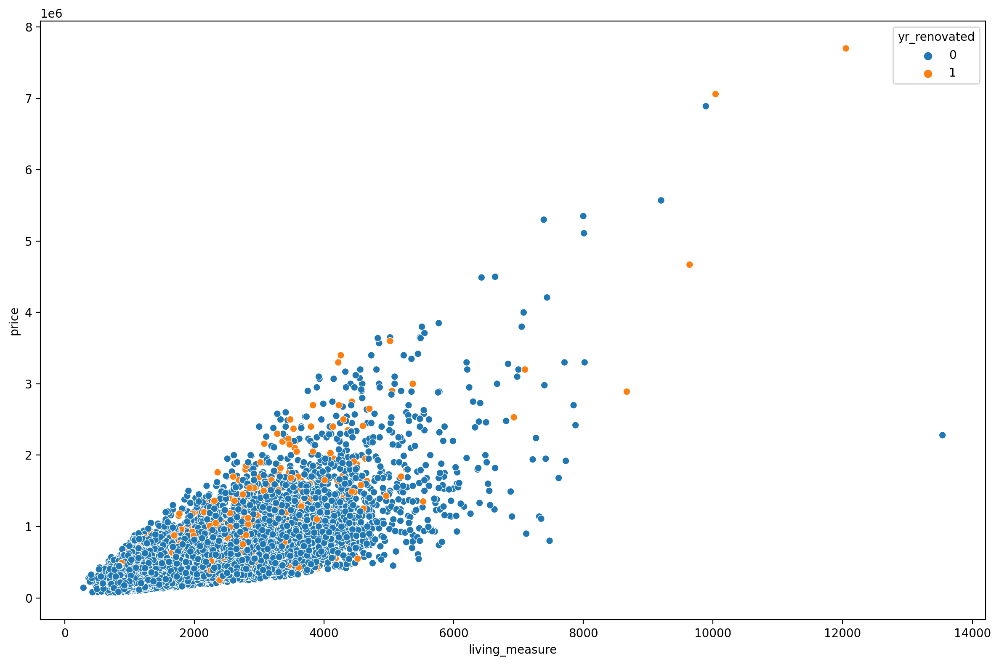

In [55]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'living_measure', y = 'price',hue = 'yr_renovated')
plt.tight_layout()
plt.savefig('scattter_livingprice_vs_price_vs_renovated.png')

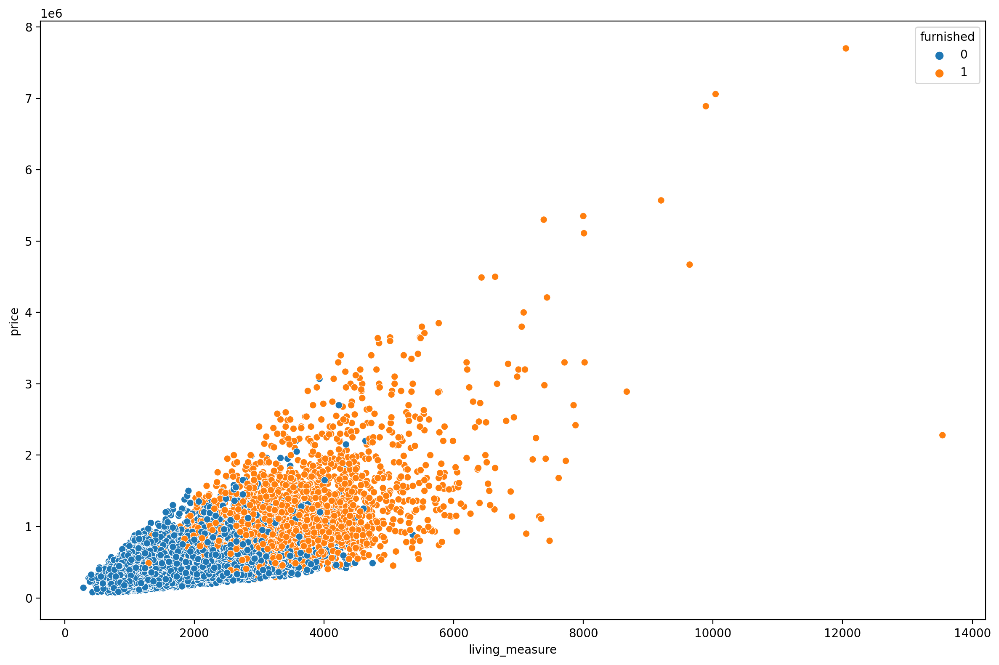

In [56]:
plt.figure(figsize = (12, 8), dpi = 200)
sns.scatterplot(data = df, x = 'living_measure', y = 'price',hue = 'furnished')
plt.tight_layout()
plt.savefig('scattter_livingprice_vs_price_vs_furnished.png')

## Multivariate Analysis

<Figure size 48000x60000 with 0 Axes>

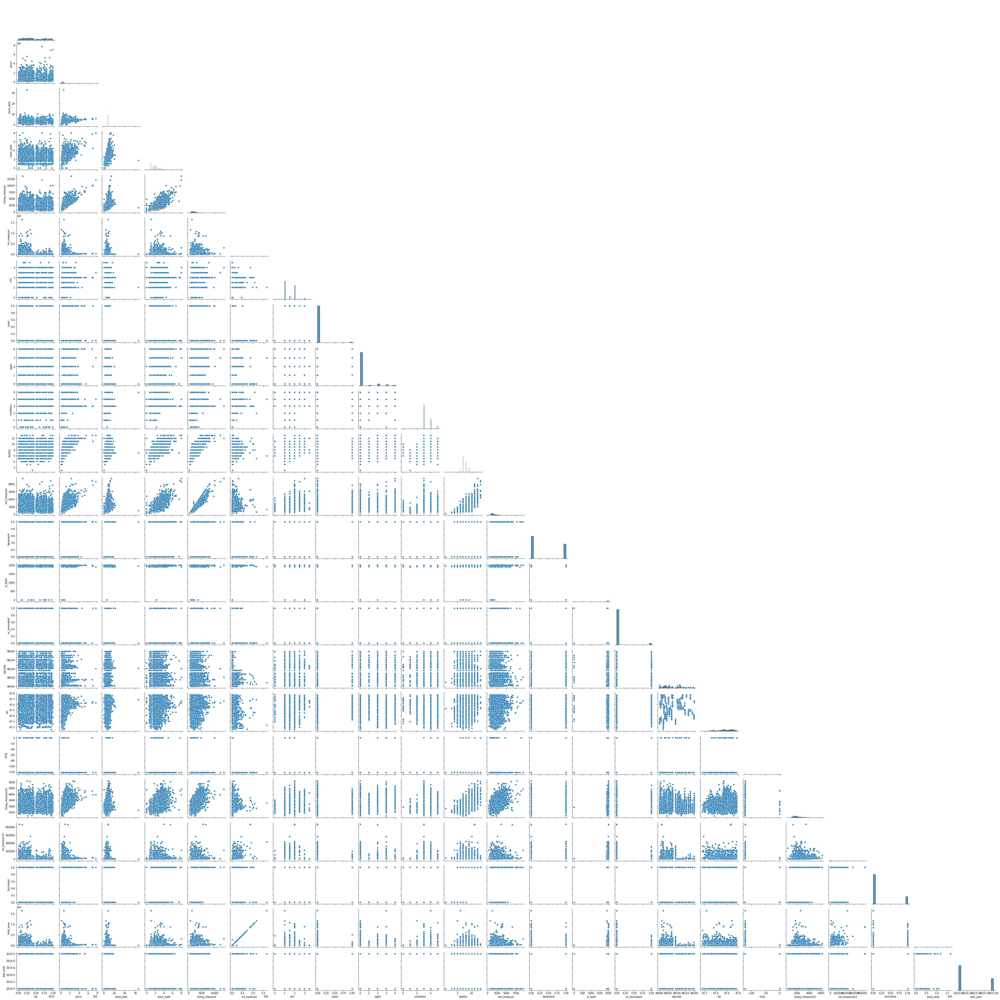

In [57]:
plt.figure(figsize=(240, 300), dpi = 200)
sns.pairplot(data = df, corner = True);
plt.savefig('Bi_Pair_plot.png')

In [58]:
corr = df.corr()
corr

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,sale_year
cid,1.000000,-0.016797,0.001492,0.005768,-0.012151,-0.131789,0.019065,-0.004184,0.011776,-0.024425,0.008159,-0.010812,0.002562,0.004928,-0.016943,-0.008224,-0.001891,0.000170,-0.003126,-0.138699,-0.009597,-0.131693,0.010128
price,-0.016797,1.000000,0.307766,0.524509,0.702066,0.089676,0.254894,0.266042,0.396999,0.035562,0.667482,0.605594,0.180167,0.033764,0.126101,-0.053168,0.306919,0.020076,0.583825,0.082597,0.564132,0.104836,0.003554
room_bed,0.001492,0.307766,1.000000,0.515184,0.575776,0.032007,0.173466,-0.006080,0.078215,0.029700,0.356037,0.476980,0.162447,0.086652,0.018148,-0.152556,-0.009410,0.018146,0.390003,0.029413,0.258054,0.044480,-0.009924
room_bath,0.005768,0.524509,0.515184,1.000000,0.753265,0.087675,0.494276,0.062046,0.186137,-0.125093,0.663739,0.684131,0.162696,0.251372,0.049631,-0.203568,0.024578,0.021357,0.566262,0.086769,0.481895,0.103922,-0.026540
living_measure,-0.012151,0.702066,0.575776,0.753265,1.000000,0.172728,0.350977,0.102542,0.284366,-0.056533,0.762485,0.876342,0.204330,0.172213,0.054941,-0.199588,0.052722,0.015235,0.753594,0.183484,0.630755,0.194181,-0.029091
lot_measure,-0.131789,0.089676,0.032007,0.087675,0.172728,1.000000,-0.006458,0.021167,0.074982,-0.007575,0.113830,0.183413,-0.035174,0.030505,0.007774,-0.129243,-0.085940,0.003033,0.145003,0.716048,0.118970,0.998082,0.005708
ceil,0.019065,0.254894,0.173466,0.494276,0.350977,-0.006458,1.000000,0.024605,0.028119,-0.255982,0.455049,0.519927,-0.255827,0.253439,0.005411,-0.058154,0.049740,-0.006580,0.276268,-0.011645,0.344460,0.001662,-0.021386
coast,-0.004184,0.266042,-0.006080,0.062046,0.102542,0.021167,0.024605,1.000000,0.400220,0.017890,0.082515,0.071330,0.036108,-0.011158,0.088745,0.030289,-0.014139,-0.004658,0.086221,0.030727,0.069101,0.023316,-0.004598
sight,0.011776,0.396999,0.078215,0.186137,0.284366,0.074982,0.028119,0.400220,1.000000,0.046696,0.250867,0.167393,0.181310,-0.024025,0.103121,0.084386,0.006001,0.006961,0.280910,0.072979,0.218305,0.081004,0.001866
condition,-0.024425,0.035562,0.029700,-0.125093,-0.056533,-0.007575,-0.255982,0.017890,0.046696,1.000000,-0.142206,-0.154711,0.131720,-0.177765,-0.058797,0.002601,-0.015685,0.002711,-0.090339,-0.001933,-0.120573,-0.008849,-0.046351


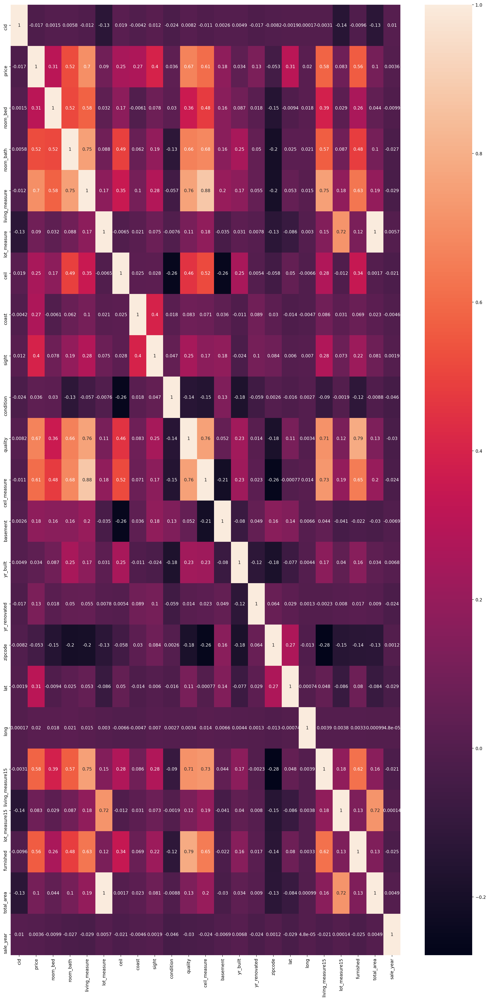

In [59]:
plt.figure(figsize = (20, 40), dpi = 200)
sns.heatmap(corr, annot = True)
plt.savefig('Bi_Heat_map.png', bbox_inches = 'tight')

# Outlier Treatment

In [60]:
def remove_outlier(col): 
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75]) 
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR) 
    upper_range= Q3+(1.5 * IQR) 
    return lower_range, upper_range


In [61]:
lratio,uratio=remove_outlier(df['cid'])
df['cid']=np.where(df['cid']>uratio,uratio,df['cid'])
df['cid']=np.where(df['cid']<lratio,lratio,df['cid'])

In [62]:
lratio,uratio=remove_outlier(df['price'])
df['price']=np.where(df['price']>uratio,uratio,df['price'])
df['price']=np.where(df['price']<lratio,lratio,df['price'])
lratio,uratio=remove_outlier(df['room_bed'])
df['room_bed']=np.where(df['room_bed']>uratio,uratio,df['room_bed'])
df['room_bed']=np.where(df['room_bed']<lratio,lratio,df['room_bed'])
lratio,uratio=remove_outlier(df['room_bath'])
df['room_bath']=np.where(df['room_bath']>uratio,uratio,df['room_bath']
)
df['room_bath']=np.where(df['room_bath']<lratio,lratio,df['room_bath']
)
lratio,uratio=remove_outlier(df['living_measure'])
df['living_measure']=np.where(df['living_measure']>uratio,uratio,df['living_measure'])
df['living_measured']=np.where(df['living_measure']<lratio,lratio,df['living_measure'])
lratio,uratio=remove_outlier(df['lot_measure'])
df['lot_measure']=np.where(df['lot_measure']>uratio,uratio,df['lot_measure'])

In [63]:
df['lot_measure']=np.where(df['lot_measure']<lratio,lratio,df['lot_measure'])
lratio,uratio=remove_outlier(df['sight'])
df['sight']=np.where(df['sight']>uratio,uratio,df['sight'])
df['sight']=np.where(df['sight']<lratio,lratio,df['sight'])
lratio,uratio=remove_outlier(df['quality'])
df['quality']=np.where(df['quality']>uratio,uratio,df['quality'])
df['quality']=np.where(df['quality']<lratio,lratio,df['quality'])
lratio,uratio=remove_outlier(df['ceil_measure'])
df['ceil_measure']=np.where(df['ceil_measure']>uratio,uratio,df['ceil_measure'])
df['ceil_measure']=np.where(df['ceil_measure']<lratio,lratio,df['ceil_measure'])
lratio,uratio=remove_outlier(df['basement'])
df['basement']=np.where(df['basement']>uratio,uratio,df['basement'])
df['basement']=np.where(df['basement']<lratio,lratio,df['basement'])
lratio,uratio=remove_outlier(df['yr_renovated'])
df['yr_renovated']=np.where(df['yr_renovated']>uratio,uratio,df['yr_renovated'])
df['yr_renovated']=np.where(df['yr_renovated']<lratio,lratio,df['yr_renovated'])
lratio,uratio=remove_outlier(df['zipcode'])
df['zipcode']=np.where(df['zipcode']>uratio,uratio,df['zipcode'])
df['zipcode']=np.where(df['zipcode']<lratio,lratio,df['zipcode'])
lratio,uratio=remove_outlier(df['lat'])
df['lat']=np.where(df['lat']>uratio,uratio,df['lat'])
df['lat']=np.where(df['lat']<lratio,lratio,df['lat'])
lratio,uratio=remove_outlier(df['living_measure15'])
df['living_measure15']=np.where(df['living_measure15']>uratio,uratio,df['living_measure15'])
df['living_measure15']=np.where(df['living_measure15']<lratio,lratio,df['living_measure15'])
lratio,uratio=remove_outlier(df['lot_measure15'])
df['lot_measure15']=np.where(df['lot_measure15']>uratio,uratio,df['lot_measure15'])
df['lot_measure15']=np.where(df['lot_measure15']<lratio,lratio,df['lot_measure15'])

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level fu

Text(0.5, 1.0, 'living_measure Analysis')

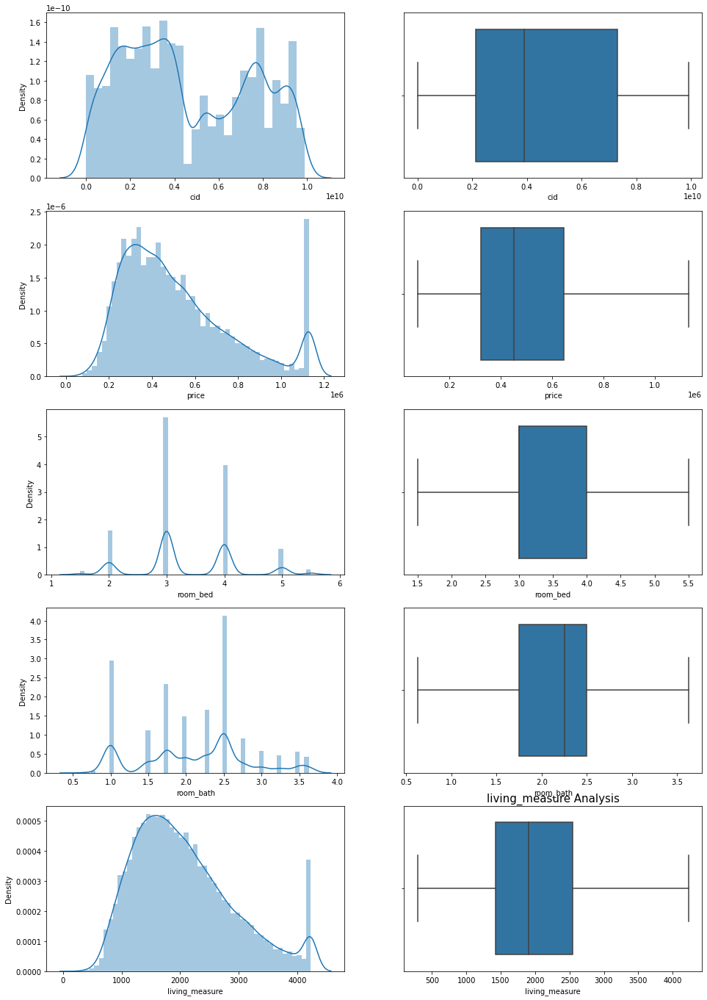

In [64]:
fig,axes = plt.subplots(nrows= 5, ncols=2)
fig.set_size_inches(16,24)
sns.distplot(df['cid'], ax= axes[0][0])
sns.boxplot(df['cid'],orient = 'H', ax= axes[0][1])
plt.title("cid Analysis", size=15)
sns.distplot(df['price'], ax= axes[1][0])
sns.boxplot(df['price'],orient = 'H', ax= axes[1][1])
plt.title("price Analysis", size=15)
sns.distplot(df['room_bed'], ax= axes[2][0])
sns.boxplot(df['room_bed'],orient = 'H', ax= axes[2][1])
plt.title("room_bed Analysis", size=15)
sns.distplot(df['room_bath'], ax= axes[3][0])
sns.boxplot(df['room_bath'],orient = 'H', ax= axes[3][1])
plt.title("room_bath Analysis", size=15)
sns.distplot(df['living_measure'], ax= axes[4][0])
sns.boxplot(df['living_measure'],orient = 'H', ax= axes[4][1])
plt.title("living_measure Analysis", size=15)


/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level fu

<AxesSubplot:xlabel='basement'>

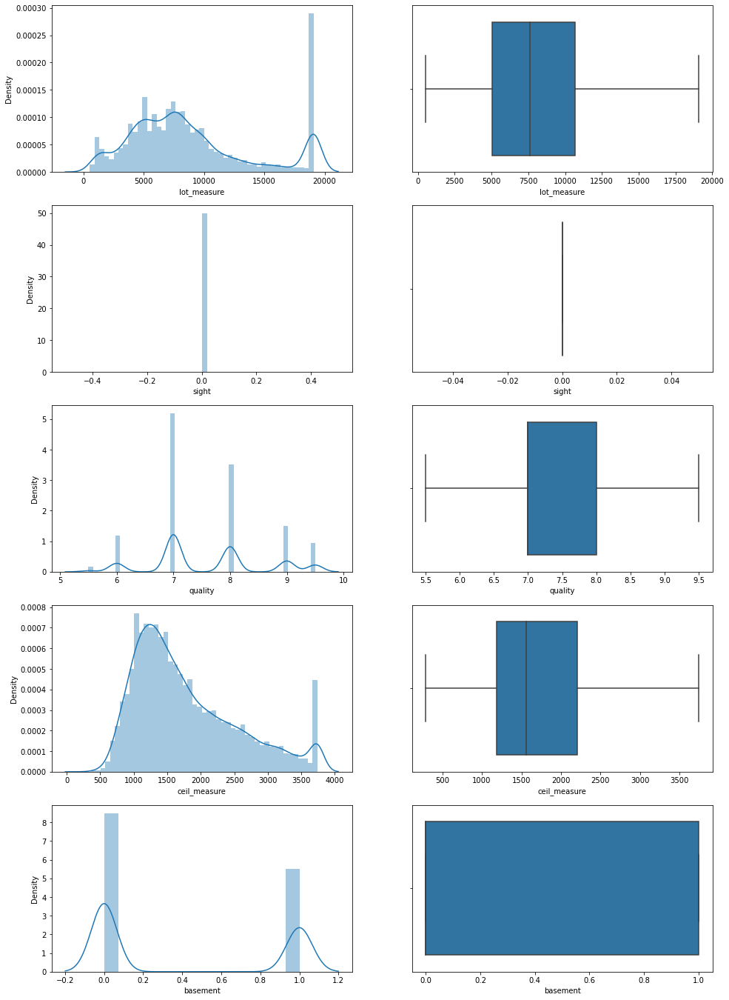

In [65]:
fig,axes = plt.subplots(nrows= 5, ncols=2)
fig.set_size_inches(16,24)
sns.distplot(df['lot_measure'], ax= axes[0][0])
sns.boxplot(df['lot_measure'],orient = 'H', ax= axes[0][1])
sns.distplot(df['sight'], ax= axes[1][0])
sns.boxplot(df['sight'],orient = 'H', ax= axes[1][1])
sns.distplot(df['quality'], ax= axes[2][0])
sns.boxplot(df['quality'],orient = 'H', ax= axes[2][1])
sns.distplot(df['ceil_measure'], ax= axes[3][0])
sns.boxplot(df['ceil_measure'],orient = 'H', ax= axes[3][1])
sns.distplot(df['basement'], ax= axes[4][0])
sns.boxplot(df['basement'],orient = 'H', ax= axes[4][1])

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated

<AxesSubplot:xlabel='lot_measure15'>

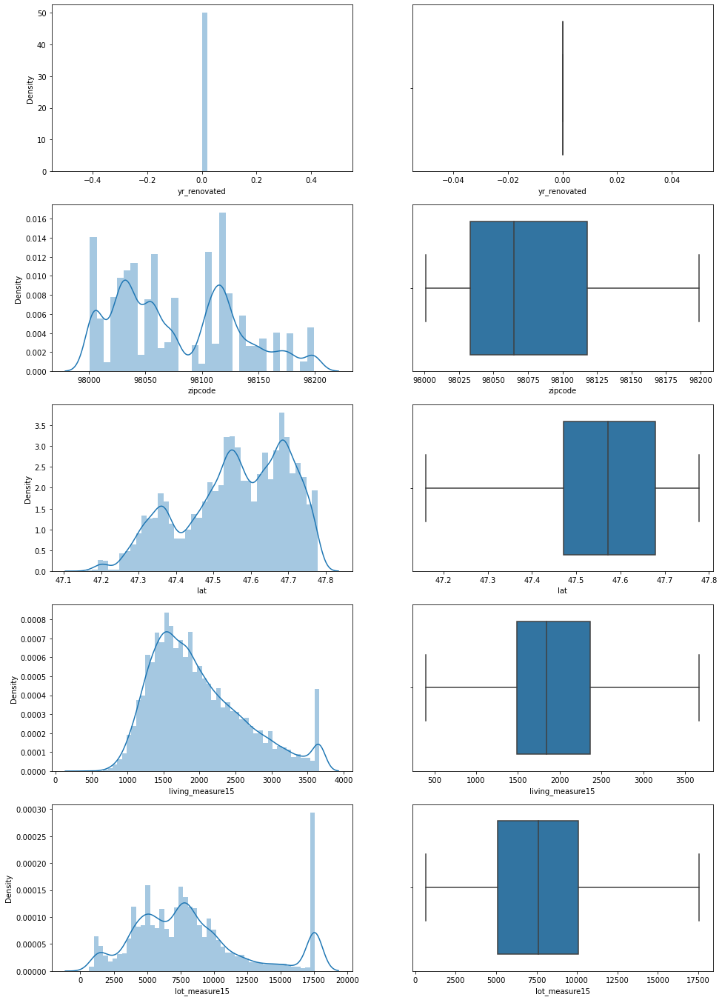

In [66]:
fig,axes = plt.subplots(nrows= 5, ncols=2)
fig.set_size_inches(16,24)
sns.distplot(df['yr_renovated'], ax= axes[0][0])
sns.boxplot(df['yr_renovated'],orient = 'H', ax= axes[0][1])
sns.distplot(df['zipcode'], ax= axes[1][0])
sns.boxplot(df['zipcode'],orient = 'H', ax= axes[1][1])
sns.distplot(df['lat'], ax= axes[2][0])
sns.boxplot(df['lat'],orient = 'H', ax= axes[2][1])
sns.distplot(df['living_measure15'], ax= axes[3][0])
sns.boxplot(df['living_measure15'],orient = 'H', ax= axes[3][1])
sns.distplot(df['lot_measure15'], ax= axes[4][0])
sns.boxplot(df['lot_measure15'],orient = 'H', ax= axes[4][1])

# Clustering


In [67]:
import matplotlib.cm as cm
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler

In [68]:
scaler = StandardScaler()

In [69]:
scaled_df=scaler.fit_transform(df)
scaled_df

array([[-0.24481169,  1.47061003,  0.3535101 , ..., -0.11212018,
         1.44790136,  1.18310224],
       [-0.49876647,  1.4458156 , -1.28621337, ..., -0.3218652 ,
         1.44790136, -1.65477935],
       [ 0.8861472 , -0.69484555,  0.89341904, ..., -0.28135475,
        -0.69065478,  1.17117837],
       ...,
       [-1.44489272, -0.67568621,  1.94524166, ...,  0.50448546,
        -0.69065478,  1.97007781],
       [ 0.93095757,  1.42079576, -0.99826193, ..., -0.18741573,
         1.44790136, -0.59355472],
       [ 1.46900759, -0.60265534,  2.47145291, ..., -0.24863847,
        -0.69065478, -0.14044758]])

In [70]:
scaled_df = pd.DataFrame(scaled_df, index=df.index,columns=df.columns)
scaled_df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,sale_year,living_measured
0,-0.244812,1.470610,0.353510,0.749093,-0.485403,1.183102,0.148598,-0.908100,-0.086632,0.0,-0.610739,0.400961,0.039884,1.243503,-0.064235,0.0,-0.821247,1.174564,-0.033312,0.070256,0.083092,-0.496556,-0.112120,1.447901,1.183102
1,-0.498766,1.445816,-1.286213,-1.597136,-1.526712,-1.654779,-1.113249,-0.908100,-0.086632,0.0,0.901624,-1.596611,-1.439165,-0.804180,-0.373982,0.0,0.748736,-0.039353,-0.052092,-0.486445,-0.962891,-0.496556,-0.321865,1.447901,-1.654779
2,0.886147,-0.694846,0.893419,0.749093,0.903009,1.171178,-1.249805,0.937388,11.543060,0.0,-0.610739,0.400961,1.662912,-0.804180,-0.064235,0.0,0.748736,-0.297726,-0.048377,0.998091,-1.345272,-0.496556,-0.281355,-0.690655,1.171178
3,0.958776,-0.652019,-1.018259,-0.424021,0.555906,-0.378925,-0.989831,0.937388,-0.086632,0.0,-0.610739,0.400961,-0.038649,-0.804180,0.675717,0.0,-1.419335,-1.614847,-0.039503,0.085720,-1.033082,-0.496556,-0.281210,-0.690655,-0.378925
4,1.171563,1.423501,-0.246389,-1.597136,-1.526712,-1.118205,-0.816847,-0.908100,-0.086632,0.0,-0.610739,-0.597825,-0.850163,-0.804180,-0.786978,0.0,0.748736,0.045087,-0.054362,-1.321496,-0.733509,-0.496556,-0.275220,1.447901,-1.118205


In [71]:
k_means = KMeans(n_clusters = 2) 

In [72]:
scaled_df.isna().sum()

cid                 0
dayhours            0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
sale_year           0
living_measured     0
dtype: int64

In [73]:
k_means.fit(scaled_df) 

KMeans(n_clusters=2)

In [74]:
k_means.inertia_

393727.2220408336

In [75]:
k_means = KMeans(n_clusters = 3)

In [76]:
 k_means.fit(scaled_df) 

KMeans(n_clusters=3)

In [77]:
k_means.inertia_

361201.1959326839

In [78]:
k_means = KMeans(n_clusters = 4) 

In [79]:
k_means.fit(scaled_df) 

KMeans(n_clusters=4)

In [80]:
k_means.inertia_

340107.770327415

In [81]:
wss = []
for i in range(2,11):
    km_model = KMeans(n_clusters= i )
    km_model.fit(scaled_df)
    wss.append(km_model.inertia_)
for i in range(2,11):
    print('The wss value for',i,'clusters is',wss[i-2])

The wss value for 2 clusters is 393727.3084395289
The wss value for 3 clusters is 361201.3821268696
The wss value for 4 clusters is 340108.427270862
The wss value for 5 clusters is 318750.74044383736
The wss value for 6 clusters is 303471.49520233145
The wss value for 7 clusters is 287594.1025857202
The wss value for 8 clusters is 266265.5433843637
The wss value for 9 clusters is 259715.4151337796
The wss value for 10 clusters is 248786.56494266138


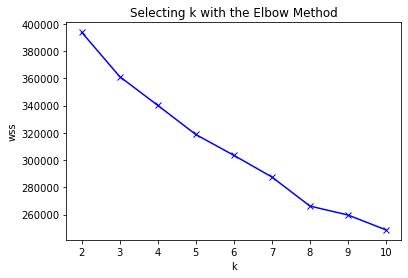

In [82]:
plt.plot(range(2,11), wss, 'bx-')
plt.xlabel('k')
plt.ylabel('wss')
plt.title('Selecting k with the Elbow Method');

In [83]:
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,sale_year,living_measured
0,3.876101e+09,20150427,600000.0,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1.0,1966.0,0.0,98034.0,47.7228,-122.183,2020.0,8660.0,0,12490.0,2015,3050.0
1,3.145600e+09,20150317,190000.0,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0.0,98118.0,47.5546,-122.274,1660.0,4100.0,0,3771.0,2015,670.0
2,7.129303e+09,20140820,735000.0,4.0,2.75,3040.0,2415.0,2.0,1.0,0.0,3.0,8.0,3040.0,0.0,1966.0,0.0,98118.0,47.5188,-122.256,2620.0,2433.0,0,5455.0,2014,3040.0
3,7.338220e+09,20141010,257000.0,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0.0,98002.0,47.3363,-122.213,2030.0,3794.0,0,5461.0,2014,1740.0
4,7.950301e+09,20150218,450000.0,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0.0,98118.0,47.5663,-122.285,1120.0,5100.0,0,5710.0,2015,1120.0


In [84]:
df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'sale_year', 'living_measured'],
      dtype='object')

- We will drop the following columns from new copied dataframe instance: cid,dayhours,yr_renovated,zipcode,lat,long

## Creating dataframe for modeling

In [85]:
df_model = df.copy()

In [86]:
df_model.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,sale_year,living_measured
0,3.876101e+09,20150427,600000.0,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1.0,1966.0,0.0,98034.0,47.7228,-122.183,2020.0,8660.0,0,12490.0,2015,3050.0
1,3.145600e+09,20150317,190000.0,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0.0,98118.0,47.5546,-122.274,1660.0,4100.0,0,3771.0,2015,670.0
2,7.129303e+09,20140820,735000.0,4.0,2.75,3040.0,2415.0,2.0,1.0,0.0,3.0,8.0,3040.0,0.0,1966.0,0.0,98118.0,47.5188,-122.256,2620.0,2433.0,0,5455.0,2014,3040.0
3,7.338220e+09,20141010,257000.0,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0.0,98002.0,47.3363,-122.213,2030.0,3794.0,0,5461.0,2014,1740.0
4,7.950301e+09,20150218,450000.0,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0.0,98118.0,47.5663,-122.285,1120.0,5100.0,0,5710.0,2015,1120.0


In [87]:
df_model.shape

(21613, 25)

In [88]:
df_final_model = df_model.drop(['cid','yr_renovated','zipcode','lat','long', 'dayhours'],axis=1)

In [89]:
df_final_model_sample = df_final_model.head()

In [90]:
dfi.export(df_final_model_sample, 'df_final_model_sample.png')

In [91]:
df_final_model.shape

(21613, 19)

In [92]:
df_final_model.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'living_measure15', 'lot_measure15',
       'furnished', 'total_area', 'sale_year', 'living_measured'],
      dtype='object')

## Creating x and y for training and test set

In [93]:
X = df_final_model.drop("price" , axis=1)
y = df_final_model["price"]

In [94]:
from sklearn.model_selection import train_test_split

In [95]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=10)

In [96]:
print(X_train.shape)
print(X_test.shape)
print(X_val.shape)

(12156, 18)
(5404, 18)
(4053, 18)


## importing the necessary libraries

In [97]:
from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [98]:
LR1 = LinearRegression() 

In [99]:
LR1.fit(X_train, y_train)

LinearRegression()

## predicting result over test data

In [100]:
y_LR1_pred_tr= LR1.predict(X_train)

In [101]:
y_LR1_pred_tst= LR1.predict(X_test)

In [102]:
y_LR1_pred_vl= LR1.predict(X_val) 

In [103]:
LR1.coef_

array([-1.96811379e+04, -1.64147061e+04,  5.73151116e+01, -8.26600368e-01,
        1.45049610e+04,  2.57349241e+05, -1.75205059e-08,  4.32495156e+04,
        7.00441474e+04, -1.49434335e-01,  4.76418890e+04, -4.59152720e+02,
        6.27296400e+01, -6.66575099e+00,  8.24179324e+04,  2.45092549e-01,
        1.77906736e+04,  5.73151117e+01])

## Model score and Deduction for each Model in a DataFrame

In [104]:
LR1_trscore=r2_score(y_train,y_LR1_pred_tr)

In [105]:
LR1_trRMSE=np.sqrt(mean_squared_error(y_train, y_LR1_pred_tr))


In [106]:
LR1_trMSE=mean_squared_error(y_train, y_LR1_pred_tr)

In [107]:
LR1_trMAE=mean_absolute_error(y_train, y_LR1_pred_tr)

In [108]:
LR1_vlscore=r2_score(y_val,y_LR1_pred_vl)
LR1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_LR1_pred_vl))
LR1_vlMSE=mean_squared_error(y_val, y_LR1_pred_vl)
LR1_vlMAE=mean_absolute_error(y_val, y_LR1_pred_vl)

In [109]:
LR1_tstscore=r2_score(y_test,y_LR1_pred_tst)
LR1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_LR1_pred_tst))
LR1_tstMSE=mean_squared_error(y_test, y_LR1_pred_tst)
LR1_tstMAE=mean_absolute_error(y_test, y_LR1_pred_tst)

In [110]:
Cmpare_df=pd.DataFrame({'Method':['Linear Reg Model1'],'ValScore':LR1_vlscore,'RMSE_vl': LR1_vlRMSE, 'MSE_vl': LR1_vlMSE,
'MAE_vl': LR1_vlMAE,'train Score':LR1_trscore,'RMSE_tr': LR1_trRMSE,
'MSE_tr': LR1_trMSE, 'MAE_tr': LR1_trMAE,'testScore':LR1_tstscore,'RMSE_tst': LR1_tstRMSE, 'MSE_tst': LR1_tstMSE,
'MAE_tst': LR1_tstMAE})

In [111]:
Cmpare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.02007,0.626274,152616.923855,2.329193e+10,117653.8665


In [112]:
dfi.export(Cmpare_df, 'Cmpare_df.png')

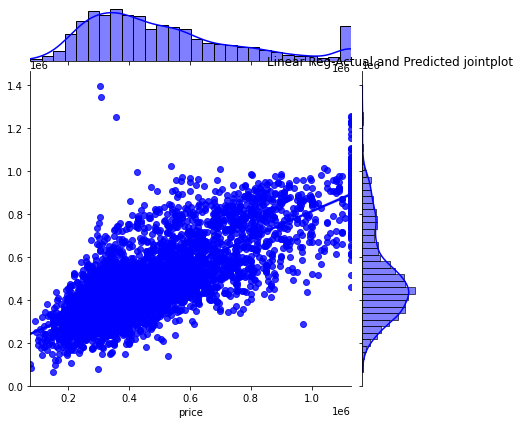

In [113]:
sns.jointplot(x=y_val, y=y_LR1_pred_vl, kind="reg", color="blue") 
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Linear Reg-Actual and Predicted jointplot')
plt.savefig('Linear Reg-Actual and Predicted jointplot')

In [114]:
Lasso1 = Lasso(alpha=1)

In [115]:
Lasso1.fit(X_train, y_train)

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127885157349524.69, tolerance: 76438357942.63286
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=1)

## predicting result over test data

In [116]:
y_Lasso1_pred_tr= Lasso1.predict(X_train)

In [117]:
y_Lasso1_pred_vl= Lasso1.predict(X_val)

In [118]:
y_Lasso1_pred_tst= Lasso1.predict(X_test)

In [119]:
Lasso1.coef_

array([-1.96814073e+04, -1.64074563e+04,  2.31060902e+02, -8.26847522e-01,
        1.44968438e+04,  2.57238160e+05,  0.00000000e+00,  4.32461507e+04,
        7.00450216e+04, -1.60075284e-01,  4.76269958e+04, -4.59163019e+02,
        6.27312702e+01, -6.66551206e+00,  8.24058000e+04,  2.45094595e-01,
        1.77856818e+04, -1.16419962e+02])

## Model score and Deduction for each Model in a DataFrame

In [120]:
Lasso1_trscore=r2_score(y_train,y_Lasso1_pred_tr)
Lasso1_trRMSE=np.sqrt(mean_squared_error(y_train, y_Lasso1_pred_tr))

In [121]:
Lasso1_trMSE=mean_squared_error(y_train, y_Lasso1_pred_tr)
Lasso1_trMAE=mean_absolute_error(y_train, y_Lasso1_pred_tr)

In [122]:
Lasso1_vlscore=r2_score(y_val,y_Lasso1_pred_vl)
Lasso1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_Lasso1_pred_vl))
Lasso1_vlMSE=mean_squared_error(y_val, y_Lasso1_pred_vl)
Lasso1_vlMAE=mean_absolute_error(y_val, y_Lasso1_pred_vl)

In [123]:
Lasso1_tstscore=r2_score(y_test,y_Lasso1_pred_tst)
Lasso1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_Lasso1_pred_tst))
Lasso1_tstMSE=mean_squared_error(y_test, y_Lasso1_pred_tst)
Lasso1_tstMAE=mean_absolute_error(y_test, y_Lasso1_pred_tst)

In [124]:
Lasso1_df=pd.DataFrame({'Method':['Linear-Reg Lasso1'],'ValScore':Lasso1_vlscore,'RMSE_vl': Lasso1_vlRMSE, 'MSE_vl':
Lasso1_vlMSE, 'MAE_vl': Lasso1_vlMAE,'trainScore':Lasso1_trscore,'RMSE_tr': Lasso1_trRMSE, 'MSE_tr':
Lasso1_trMSE, 'MAE_tr': Lasso1_trMAE,'testScore':Lasso1_tstscore,'RMSE_tst': Lasso1_tstRMSE, 'MSE_tst':
Lasso1_tstMSE, 'MAE_tst': Lasso1_tstMAE})

In [125]:
Compare_df = pd.concat([Cmpare_df, Lasso1_df])

In [126]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254


In [127]:
dfi.export(Compare_df, 'Cmpare_df_2.png')

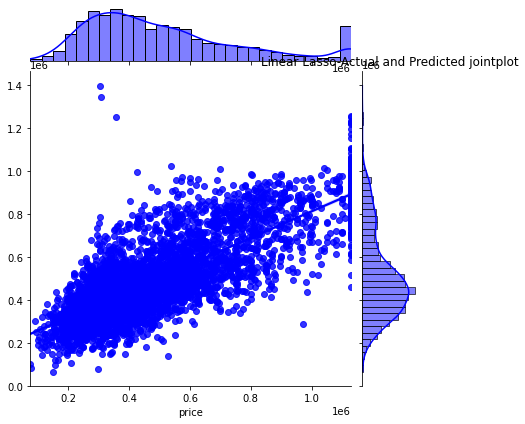

In [216]:
sns.jointplot(x=y_val, y=y_Lasso1_pred_vl, kind="reg",color="blue")
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Linear Lasso-Actual and Predicted jointplot')
plt.savefig('Linear Lasso-Actual and Predicted jointplot')

## Ridge model

In [128]:
Ridge1 = Ridge(alpha=0.5)

In [129]:
Ridge1.fit(X_train, y_train)

Ridge(alpha=0.5)

## predicting result over test data

In [130]:
y_Ridge1_predtr= Ridge1.predict(X_train)
y_Ridge1_predtst= Ridge1.predict(X_test)
y_Ridge1_predvl= Ridge1.predict(X_val)

In [131]:
Ridge1.coef_

array([-1.96943838e+04, -1.64105478e+04,  5.73385477e+01, -8.27256312e-01,
        1.45166737e+04,  2.56143774e+05,  0.00000000e+00,  4.32456249e+04,
        7.00440457e+04, -1.82598332e-01,  4.76196115e+04, -4.59214177e+02,
        6.27402170e+01, -6.66186263e+00,  8.23762488e+04,  2.44998320e-01,
        1.77859236e+04,  5.73389028e+01])

## Model score and Deduction for each Model in a DataFrame

In [132]:
Ridge1_trscore=r2_score(y_train,y_Ridge1_predtr)
Ridge1_trRMSE=np.sqrt(mean_squared_error(y_train, y_Ridge1_predtr))
Ridge1_trMSE=mean_squared_error(y_train, y_Ridge1_predtr)
Ridge1_trMAE=mean_absolute_error(y_train, y_Ridge1_predtr)

In [133]:
Ridge1_tstscore=r2_score(y_test,y_Ridge1_predtst)
Ridge1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_Ridge1_predtst))
Ridge1_tstMSE=mean_squared_error(y_test, y_Ridge1_predtst)
Ridge1_tstMAE=mean_absolute_error(y_test, y_Ridge1_predtst)

In [134]:
Ridge1_vlscore=r2_score(y_val,y_Ridge1_predvl)
Ridge1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_Ridge1_predvl))
Ridge1_vlMSE=mean_squared_error(y_val, y_Ridge1_predvl)
Ridge1_vlMAE=mean_absolute_error(y_val, y_Ridge1_predvl)

In [135]:
Ridge1_df=pd.DataFrame({'Method':['Linear-Reg Ridge1'],'ValScore':Ridge1_vlscore,'RMSE_vl': Ridge1_vlRMSE, 'MSE_vl':
Ridge1_vlMSE, 'MAE_vl': Ridge1_vlMAE,'trainScore':Ridge1_trscore,'RMSE_tr': Ridge1_trRMSE, 'MSE_tr':
Ridge1_trMSE, 'MAE_tr': Ridge1_trMAE,'testScore':Ridge1_tstscore,'RMSE_tst': Ridge1_tstRMSE, 'MSE_tst':
Ridge1_tstMSE, 'MAE_tst': Ridge1_tstMAE})

In [136]:
Compare_df = pd.concat([Compare_df, Ridge1_df])

In [137]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254
0,Linear-Reg Ridge1,0.616639,153782.276450,2.364899e+10,118930.208177,NaN,154120.453530,2.375311e+10,118802.836268,0.626275,152616.696860,2.329186e+10,117653.066949,0.622254


In [138]:
dfi.export(Compare_df, 'Cmpare_df_3.png')

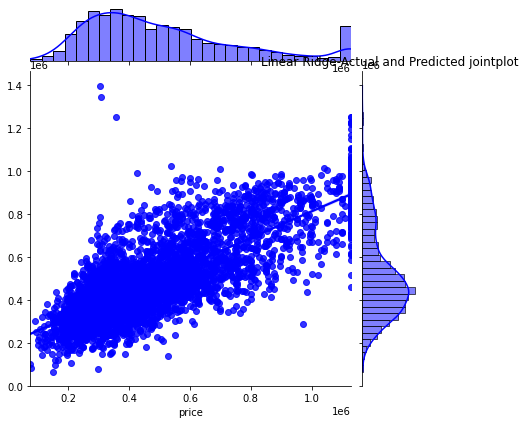

In [139]:
sns.jointplot(x=y_val, y=y_Ridge1_predvl, kind="reg",color="blue")
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Linear Ridge-Actual and Predicted jointplot')
plt.savefig('Linear Ridge-Actual and Predicted jointplo')

## KNN Model

In [140]:
from sklearn.neighbors import KNeighborsRegressor

In [141]:
knn1 = KNeighborsRegressor(n_neighbors=4,weights='distance')

In [142]:
knn1.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=4, weights='distance')

## predicting result over test data

In [143]:
y_knn1_predtr= knn1.predict(X_train)
y_knn1_predtst= knn1.predict(X_test)
y_knn1_predvl= knn1.predict(X_val)

## Model score and Deduction for each Model in a DataFrame

In [144]:
knn1_trscore=r2_score(y_train,y_knn1_predtr)
knn1_trRMSE=np.sqrt(mean_squared_error(y_train, y_knn1_predtr))
knn1_trMSE=mean_squared_error(y_train, y_knn1_predtr)
knn1_trMAE=mean_absolute_error(y_train, y_knn1_predtr)

In [145]:
knn1_tstscore=r2_score(y_test,y_knn1_predtst)
knn1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_knn1_predtst))
knn1_tstMSE=mean_squared_error(y_test, y_knn1_predtst)
knn1_tstMAE=mean_absolute_error(y_test, y_knn1_predtst)

In [146]:
knn1_vlscore=r2_score(y_val,y_knn1_predvl)
knn1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_knn1_predvl))
knn1_vlMSE=mean_squared_error(y_val, y_knn1_predvl)
knn1_vlMAE=mean_absolute_error(y_val, y_knn1_predvl)

In [147]:
knn1_df=pd.DataFrame({'Method':['knn1'],'ValScore':knn1_vlscore,'RMSE_vl': knn1_vlRMSE, 'MSE_vl': knn1_vlMSE,
'MAE_vl': knn1_vlMAE,'train Score':knn1_trscore,'RMSE_tr':
knn1_trRMSE, 'MSE_tr': knn1_trMSE, 'MAE_tr': knn1_trMAE,'testScore':knn1_tstscore,'RMSE_tst': knn1_tstRMSE, 'MSE_tst': knn1_tstMSE,
'MAE_tst': knn1_tstMAE})

In [148]:
Compare_df = pd.concat([Compare_df, knn1_df])

In [149]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254
0,Linear-Reg Ridge1,0.616639,153782.276450,2.364899e+10,118930.208177,NaN,154120.453530,2.375311e+10,118802.836268,0.626275,152616.696860,2.329186e+10,117653.066949,0.622254
0,knn1,0.483441,178509.781945,3.186574e+10,134316.782933,0.999867,2894.947675,8.380722e+06,102.017358,0.516266,173631.792422,3.014800e+10,130782.670117,NaN


In [150]:
dfi.export(Compare_df, 'Cmpare_df_4.png')

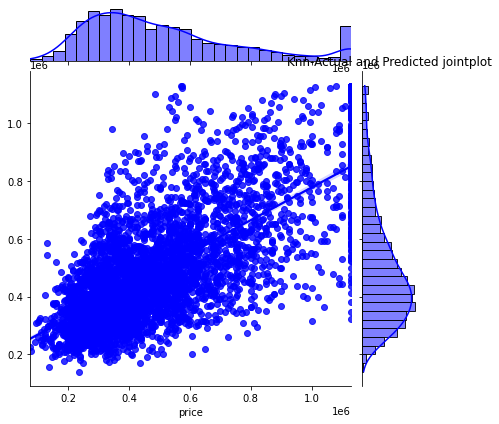

In [151]:
sns.jointplot(x=y_val, y=y_knn1_predvl, kind="reg", color="blue")
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Knn-Actual and Predicted jointplot')
plt.savefig('Knn-Actual and Predicted jointplot')

## Decision Tree

In [152]:
from sklearn.tree import DecisionTreeRegressor 

In [153]:
DT1 = DecisionTreeRegressor()

In [154]:
DT1.fit(X_train, y_train)

DecisionTreeRegressor()

## Model score and Deduction for each Model in a DataFrame

In [155]:
y_DT1_predtr= DT1.predict(X_train)
y_DT1_predtst= DT1.predict(X_test)
y_DT1_predvl= DT1.predict(X_val)

In [156]:
DT1_trscore=r2_score(y_train,y_DT1_predtr)
DT1_trRMSE=np.sqrt(mean_squared_error(y_train, y_DT1_predtr))
DT1_trMSE=mean_squared_error(y_train, y_DT1_predtr)
DT1_trMAE=mean_absolute_error(y_train, y_DT1_predtr)

In [157]:
DT1_tstscore=r2_score(y_test,y_DT1_predtst)
DT1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_DT1_predtst))
DT1_tstMSE=mean_squared_error(y_test, y_DT1_predtst)
DT1_tstMAE=mean_absolute_error(y_test, y_DT1_predtst)

In [158]:
DT1_vlscore=r2_score(y_val,y_DT1_predvl)
DT1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_DT1_predvl))
DT1_vlMSE=mean_squared_error(y_val, y_DT1_predvl)
DT1_vlMAE=mean_absolute_error(y_val, y_DT1_predvl)

In [159]:
DT1_df=pd.DataFrame({'Method':['DT1'],'ValScore':DT1_vlscore,'RMSE_vl': DT1_vlRMSE, 'MSE_vl': DT1_vlMSE,
'MAE_vl': DT1_vlMAE,'train Score':DT1_trscore,'RMSE_tr': DT1_trRMSE,
'MSE_tr': DT1_trMSE, 'MAE_tr': DT1_trMAE,'testScore':DT1_tstscore,'RMSE_tst': DT1_tstRMSE, 'MSE_tst': DT1_tstMSE,
'MAE_tst': DT1_tstMAE})


In [160]:
Compare_df = pd.concat([Compare_df, DT1_df])

In [161]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254
0,Linear-Reg Ridge1,0.616639,153782.276450,2.364899e+10,118930.208177,NaN,154120.453530,2.375311e+10,118802.836268,0.626275,152616.696860,2.329186e+10,117653.066949,0.622254
0,knn1,0.483441,178509.781945,3.186574e+10,134316.782933,0.999867,2894.947675,8.380722e+06,102.017358,0.516266,173631.792422,3.014800e+10,130782.670117,NaN
0,DT1,0.462812,182039.425120,3.313835e+10,132240.519615,0.999867,2894.947675,8.380722e+06,102.017358,0.510069,174740.434608,3.053422e+10,127121.313472,NaN


In [162]:
dfi.export(Compare_df, 'Cmpare_df_5.png')

In [163]:
DT2 = DecisionTreeRegressor(max_depth=10,min_samples_leaf=5)

In [164]:
DT2.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, min_samples_leaf=5)

In [165]:
y_DT2_predtr= DT2.predict(X_train)
y_DT2_predtst= DT2.predict(X_test)
y_DT2_predvl= DT2.predict(X_val)


## Model score and Deduction for each Model in a DataFrame

In [166]:
DT2_trscore=r2_score(y_train,y_DT2_predtr)
DT2_trRMSE=np.sqrt(mean_squared_error(y_train, y_DT2_predtr))
DT2_trMSE=mean_squared_error(y_train, y_DT2_predtr)
DT2_trMAE=mean_absolute_error(y_train, y_DT2_predtr)

In [167]:
DT2_tstscore=r2_score(y_test,y_DT2_predtst)
DT2_tstRMSE=np.sqrt(mean_squared_error(y_test, y_DT2_predtst))
DT2_tstMSE=mean_squared_error(y_test, y_DT2_predtst)
DT2_tstMAE=mean_absolute_error(y_test, y_DT2_predtst)

In [168]:
DT2_vlscore=r2_score(y_val,y_DT2_predvl)
DT2_vlRMSE=np.sqrt(mean_squared_error(y_val, y_DT2_predvl))
DT2_vlMSE=mean_squared_error(y_val, y_DT2_predvl)
DT2_vlMAE=mean_absolute_error(y_val, y_DT2_predvl)

In [169]:
DT2_df=pd.DataFrame({'Method':['DT2'],'ValScore':DT2_vlscore,'RMSE_vl': DT2_vlRMSE, 'MSE_vl': DT2_vlMSE,
'MAE_vl': DT2_vlMAE,'train Score':DT2_trscore,'RMSE_tr': DT2_trRMSE,
'MSE_tr': DT2_trMSE, 'MAE_tr': DT2_trMAE,'testScore':DT2_tstscore,'RMSE_tst': DT2_tstRMSE, 'MSE_tst': DT2_tstMSE,
'MAE_tst': DT2_tstMAE})

In [170]:
Compare_df = pd.concat([Compare_df, DT2_df])

In [171]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254
0,Linear-Reg Ridge1,0.616639,153782.276450,2.364899e+10,118930.208177,NaN,154120.453530,2.375311e+10,118802.836268,0.626275,152616.696860,2.329186e+10,117653.066949,0.622254
0,knn1,0.483441,178509.781945,3.186574e+10,134316.782933,0.999867,2894.947675,8.380722e+06,102.017358,0.516266,173631.792422,3.014800e+10,130782.670117,NaN
0,DT1,0.462812,182039.425120,3.313835e+10,132240.519615,0.999867,2894.947675,8.380722e+06,102.017358,0.510069,174740.434608,3.053422e+10,127121.313472,NaN
0,DT2,0.646662,147637.647876,2.179688e+10,110182.301762,0.786045,115990.289898,1.345375e+10,88257.756875,0.658538,145880.530749,2.128113e+10,109385.369820,NaN


In [172]:
dfi.export(Compare_df, 'Cmpare_df_6.png')

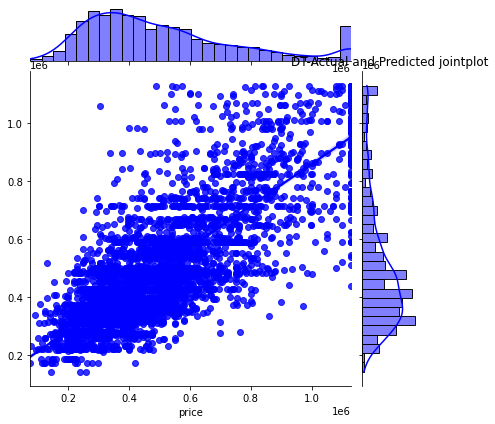

In [173]:
sns.jointplot(x=y_val, y=y_DT2_predvl, kind="reg", color="blue")
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('DT-Actual and Predicted jointplot')
plt.savefig('DT-Actual and Predicted jointplot')

## Ensemble techniques

### Boosting and Bagging

In [174]:
from sklearn.ensemble import GradientBoostingRegressor, BaggingRegressor

In [175]:
GB1=GradientBoostingRegressor(n_estimators = 200, learning_rate = 0.1, random_state=22)

In [176]:
GB1.fit(X_train, y_train)

GradientBoostingRegressor(n_estimators=200, random_state=22)

In [177]:
y_GB1_predtr= GB1.predict(X_train)
y_GB1_predtst= GB1.predict(X_test)
y_GB1_predvl= GB1.predict(X_val)

## Model score and Deduction for each Model in a DataFrame

In [178]:
GB1_trscore=r2_score(y_train,y_GB1_predtr)
GB1_trRMSE=np.sqrt(mean_squared_error(y_train, y_GB1_predtr))
GB1_trMSE=mean_squared_error(y_train, y_GB1_predtr)
GB1_trMAE=mean_absolute_error(y_train, y_GB1_predtr)

In [179]:
GB1_tstscore=r2_score(y_test,y_GB1_predtst)
GB1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_GB1_predtst))
GB1_tstMSE=mean_squared_error(y_test, y_GB1_predtst)
GB1_tstMAE=mean_absolute_error(y_test, y_GB1_predtst)

In [180]:
GB1_vlscore=r2_score(y_val,y_GB1_predvl)
GB1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_GB1_predvl))
GB1_vlMSE=mean_squared_error(y_val, y_GB1_predvl)
GB1_vlMAE=mean_absolute_error(y_val, y_GB1_predvl)

In [181]:
GB1_df=pd.DataFrame({'Method':['GB1'],'ValScore':GB1_vlscore,'RMSE_vl': GB1_vlRMSE, 'MSE_vl': GB1_vlMSE,
'MAE_vl': GB1_vlMAE,'train Score':GB1_trscore,'RMSE_tr': GB1_trRMSE,
'MSE_tr': GB1_trMSE, 'MAE_tr': GB1_trMAE,'testScore':GB1_tstscore,'RMSE_tst': GB1_tstRMSE, 'MSE_tst': GB1_tstMSE,
'MAE_tst': GB1_tstMAE})

In [182]:
Compare_df = pd.concat([Compare_df, GB1_df])

In [183]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254
0,Linear-Reg Ridge1,0.616639,153782.276450,2.364899e+10,118930.208177,NaN,154120.453530,2.375311e+10,118802.836268,0.626275,152616.696860,2.329186e+10,117653.066949,0.622254
0,knn1,0.483441,178509.781945,3.186574e+10,134316.782933,0.999867,2894.947675,8.380722e+06,102.017358,0.516266,173631.792422,3.014800e+10,130782.670117,NaN
0,DT1,0.462812,182039.425120,3.313835e+10,132240.519615,0.999867,2894.947675,8.380722e+06,102.017358,0.510069,174740.434608,3.053422e+10,127121.313472,NaN
0,DT2,0.646662,147637.647876,2.179688e+10,110182.301762,0.786045,115990.289898,1.345375e+10,88257.756875,0.658538,145880.530749,2.128113e+10,109385.369820,NaN
0,GB1,0.723403,130625.011356,1.706289e+10,100628.961490,0.760326,122763.958013,1.507099e+10,94543.984478,0.731302,129407.089219,1.674619e+10,98692.574385,NaN


In [184]:
dfi.export(Compare_df, 'Cmpare_df_7.png')

In [185]:
BGG1=BaggingRegressor(n_estimators=50, oob_score=True,random_state=14)

In [186]:
BGG1.fit(X_train, y_train)

BaggingRegressor(n_estimators=50, oob_score=True, random_state=14)

In [187]:
y_BGG1_predtr= BGG1.predict(X_train)
y_BGG1_predtst= BGG1.predict(X_test)
y_BGG1_predvl= BGG1.predict(X_val)

## Model score and Deduction for each Model in a DataFrame

In [188]:
BGG1_trscore=r2_score(y_train,y_BGG1_predtr)
BGG1_trRMSE=np.sqrt(mean_squared_error(y_train, y_BGG1_predtr))
BGG1_trMSE=mean_squared_error(y_train, y_BGG1_predtr)
BGG1_trMAE=mean_absolute_error(y_train, y_BGG1_predtr)

In [189]:
BGG1_tstscore=r2_score(y_test,y_BGG1_predtst)
BGG1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_BGG1_predtst))
BGG1_tstMSE=mean_squared_error(y_test, y_BGG1_predtst)
BGG1_tstMAE=mean_absolute_error(y_test, y_BGG1_predtst)

In [190]:
BGG1_vlscore=r2_score(y_val,y_BGG1_predvl)
BGG1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_BGG1_predvl))
BGG1_vlMSE=mean_squared_error(y_val, y_BGG1_predvl)
BGG1_vlMAE=mean_absolute_error(y_val, y_BGG1_predvl)

In [191]:
BGG1_df=pd.DataFrame({'Method':['BGG1'],'ValScore':BGG1_vlscore,'RMSE_vl': BGG1_vlRMSE, 
'MSE_vl':BGG1_vlMSE , 'MAE_vl': BGG1_vlMAE,'train Score':BGG1_trscore,'RMSE_tr': BGG1_trRMSE, 
'MSE_tr': BGG1_trMSE, 'MAE_tr': BGG1_trMAE,'test Score':BGG1_tstscore,'RMSE_tst': BGG1_tstRMSE
,'MSE_tst': BGG1_tstMSE, 'MAE_tst': BGG1_tstMAE})

In [192]:
Compare_df = pd.concat([Compare_df, BGG1_df])

In [193]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore,test Score
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254,NaN
0,Linear-Reg Ridge1,0.616639,153782.276450,2.364899e+10,118930.208177,NaN,154120.453530,2.375311e+10,118802.836268,0.626275,152616.696860,2.329186e+10,117653.066949,0.622254,NaN
0,knn1,0.483441,178509.781945,3.186574e+10,134316.782933,0.999867,2894.947675,8.380722e+06,102.017358,0.516266,173631.792422,3.014800e+10,130782.670117,NaN,NaN
0,DT1,0.462812,182039.425120,3.313835e+10,132240.519615,0.999867,2894.947675,8.380722e+06,102.017358,0.510069,174740.434608,3.053422e+10,127121.313472,NaN,NaN
0,DT2,0.646662,147637.647876,2.179688e+10,110182.301762,0.786045,115990.289898,1.345375e+10,88257.756875,0.658538,145880.530749,2.128113e+10,109385.369820,NaN,NaN
0,GB1,0.723403,130625.011356,1.706289e+10,100628.961490,0.760326,122763.958013,1.507099e+10,94543.984478,0.731302,129407.089219,1.674619e+10,98692.574385,NaN,NaN
0,BGG1,0.713877,132855.189069,1.765050e+10,100125.957019,0.960666,49732.977828,2.473369e+09,36591.906800,NaN,129665.961533,1.681326e+10,98001.382741,NaN,0.730226


In [194]:
dfi.export(Compare_df, 'Cmpare_df_8.png')

## Random Forest Regressor

In [195]:
from sklearn.ensemble import RandomForestRegressor 

In [196]:
RF1=RandomForestRegressor()   

In [197]:
RF1.fit(X_train, y_train)

RandomForestRegressor()

In [198]:
y_RF1_predtr= RF1.predict(X_train)
y_RF1_predtst= RF1.predict(X_test)
y_RF1_predvl= RF1.predict(X_val)

## Model score and Deduction for each Model in a DataFrame

In [199]:
RF1_trscore=r2_score(y_train,y_RF1_predtr)
RF1_trRMSE=np.sqrt(mean_squared_error(y_train, y_RF1_predtr))
RF1_trMSE=mean_squared_error(y_train, y_RF1_predtr)
RF1_trMAE=mean_absolute_error(y_train, y_RF1_predtr)

In [200]:
RF1_tstscore=r2_score(y_test,y_RF1_predtst)
RF1_tstRMSE=np.sqrt(mean_squared_error(y_test, y_RF1_predtst))
RF1_tstMSE=mean_squared_error(y_test, y_RF1_predtst)
RF1_tstMAE=mean_absolute_error(y_test, y_RF1_predtst)

In [201]:
RF1_vlscore=r2_score(y_val,y_RF1_predvl)
RF1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_RF1_predvl))
RF1_vlMSE=mean_squared_error(y_val, y_RF1_predvl)
RF1_vlMAE=mean_absolute_error(y_val, y_RF1_predvl)

In [202]:
RF1_df=pd.DataFrame({'Method':['RF1'],'ValScore':RF1_vlscore,'RMSE_vl': RF1_vlRMSE, 'MSE_vl':RF1_vlMSE,
'MAE_vl': RF1_vlMAE,'train Score':RF1_trscore,'RMSE_tr': RF1_trRMSE,
'MSE_tr': RF1_trMSE, 'MAE_tr': RF1_trMAE,'testScore':RF1_tstscore,'RMSE_tst': RF1_tstRMSE, 'MSE_tst': RF1_tstMSE,
'MAE_tst': RF1_tstMAE})

In [203]:
Compare_df = pd.concat([Compare_df, RF1_df])

In [204]:
Compare_df

,Method,ValScore,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,testScore,RMSE_tst,MSE_tst,MAE_tst,trainScore,test Score
0,Linear Reg Model1,0.616641,153781.802712,2.364884e+10,118930.926585,0.622254,154120.411741,2.375310e+10,118803.020070,0.626274,152616.923855,2.329193e+10,117653.866500,NaN,NaN
0,Linear-Reg Lasso1,0.616641,153781.841343,2.364885e+10,118930.869381,NaN,154120.412262,2.375310e+10,118803.079357,0.626275,152616.782662,2.329188e+10,117653.793293,0.622254,NaN
0,Linear-Reg Ridge1,0.616639,153782.276450,2.364899e+10,118930.208177,NaN,154120.453530,2.375311e+10,118802.836268,0.626275,152616.696860,2.329186e+10,117653.066949,0.622254,NaN
0,knn1,0.483441,178509.781945,3.186574e+10,134316.782933,0.999867,2894.947675,8.380722e+06,102.017358,0.516266,173631.792422,3.014800e+10,130782.670117,NaN,NaN
0,DT1,0.462812,182039.425120,3.313835e+10,132240.519615,0.999867,2894.947675,8.380722e+06,102.017358,0.510069,174740.434608,3.053422e+10,127121.313472,NaN,NaN
0,DT2,0.646662,147637.647876,2.179688e+10,110182.301762,0.786045,115990.289898,1.345375e+10,88257.756875,0.658538,145880.530749,2.128113e+10,109385.369820,NaN,NaN
0,GB1,0.723403,130625.011356,1.706289e+10,100628.961490,0.760326,122763.958013,1.507099e+10,94543.984478,0.731302,129407.089219,1.674619e+10,98692.574385,NaN,NaN
0,BGG1,0.713877,132855.189069,1.765050e+10,100125.957019,0.960666,49732.977828,2.473369e+09,36591.906800,NaN,129665.961533,1.681326e+10,98001.382741,NaN,0.730226
0,RF1,0.717482,132015.558007,1.742811e+10,99217.214051,0.961919,48934.554997,2.394591e+09,36160.345009,0.732248,129179.115772,1.668724e+10,97785.738588,NaN,NaN


In [205]:
dfi.export(Compare_df, 'Cmpare_df_9.png')

## Feature Importance

In [206]:
rf_imp_feature_1=pd.DataFrame(RF1.feature_importances_, columns =
["Imp"], index = X_val.columns)

In [207]:
rf_imp_feature_1.sort_values(by="Imp",ascending=False)
rf_imp_feature_1['Imp'] = rf_imp_feature_1['Imp'].map('{0:.5f}'.format)

In [208]:
rf_imp_feature_1=rf_imp_feature_1.sort_values(by="Imp",ascending=False)

In [209]:
rf_imp_feature_1.Imp=rf_imp_feature_1.Imp.astype("float")

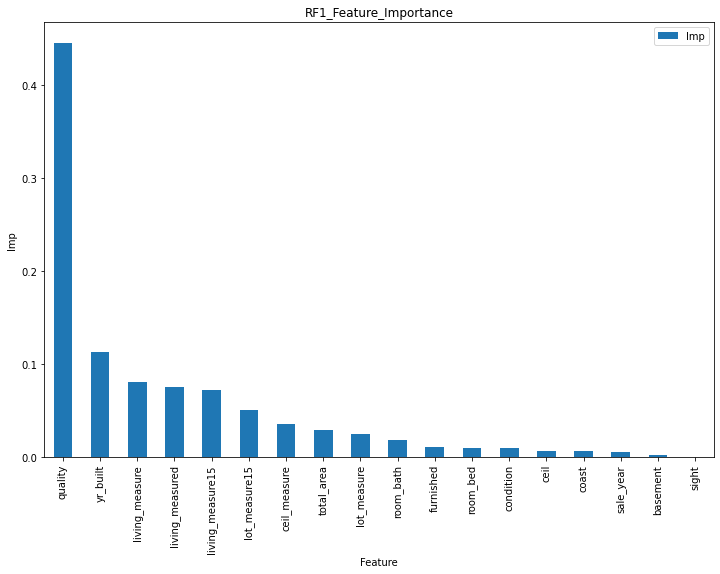

In [210]:
rf_imp_feature_1[:30].plot.bar(figsize=(12,8))
plt.xlabel('Feature')
plt.ylabel('Imp')
plt.title('RF1_Feature_Importance')
plt.savefig('RF1_Feature_Importance')

In [211]:
print("First 20 feature importance:\t",
(rf_imp_feature_1[:20].sum())*100)
print("First 30 feature importance:\t",
(rf_imp_feature_1[:30].sum())*100)

First 20 feature importance:	 Imp    100.001
dtype: float64
First 30 feature importance:	 Imp    100.001
dtype: float64


In [212]:
GB_imp_feature_1=pd.DataFrame(GB1.feature_importances_, columns =
["Imp"], index = X_val.columns)
GB_imp_feature_1.sort_values(by="Imp",ascending=False)
GB_imp_feature_1['Imp'] =GB_imp_feature_1['Imp'].map('{0:.5f}'.format)
GB_imp_feature_1=GB_imp_feature_1.sort_values(by="Imp",ascending=False
)
GB_imp_feature_1.Imp=GB_imp_feature_1.Imp.astype("float")


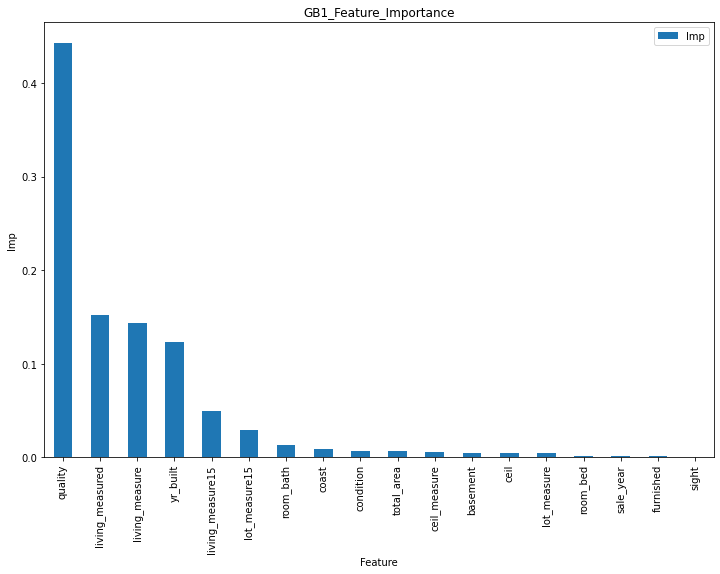

In [213]:
GB_imp_feature_1[:30].plot.bar(figsize=(12,8))
plt.xlabel('Feature')
plt.ylabel('Imp')
plt.title('GB1_Feature_Importance')
plt.savefig('GB1_Feature_Importance')

In [214]:
print("First 20 feature importance:\t",
(GB_imp_feature_1[:20].sum())*100)
print("First 30 feature importance:\t",
(GB_imp_feature_1[:30].sum())*100)

First 20 feature importance:	 Imp    99.999
dtype: float64
First 30 feature importance:	 Imp    99.999
dtype: float64
